<a href="https://colab.research.google.com/github/KamusiiimeImmaculate/Arduino/blob/master/Ananlysing_gender_distribution_in_vector_control.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Installing and import the the necessary libraries

In [ ]:
#Installing and import the the necessary libraries
#pip install pandas
import pandas as pd
import numpy as np
import nltk
import re

# Visualization Libraries
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import string
from wordcloud import WordCloud
from textblob import TextBlob
import gensim
import spacy

# Ensure nltk resources are downloaded (corpora, tokenizers, etc.)
nltk.download('punkt')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

#Loading the dataset

In [ ]:
#Loading the dataset
from google.colab import files
uploaded = files.upload()

Saving gnd.xlsx to gnd.xlsx


In [ ]:
df = pd.read_excel('gnd.xlsx')
df.head()

,Country of origin,country of work,institution_type,Name_Institution,age,Gender,marital_status,Education,work_Vector_control,VC aspect,...,"Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",Develop and implement inclusive policies,Flexible work arrangements and promoting life-work balance,Mentorship and scholarship programs to support professional development,Promote equal opportunities for all,Address existing barriers and biases that prevent men and women from accessing opportunities,Accessible reporting mechanisms for gender disputes,Establish supportive networks within institutions and celebrate diversity,"Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust","5.8. If there are other options you would like to suggest, please list them here"
0,Cabo Verde,Cabo Verde,Research Institution,National Institute of Public Health,26 - 35,1,Currently married,2,1,Vector control product testing Field surveys E...,...,5,5,5,5,5,5,5,5,5,NaN
1,Uganda,Uganda,Government Agency/local government,Kazo District,26 - 35,1,Never married,1,1,Vector control product testing Epidemiological...,...,4,4,4,4,5,5,4,2,2,NaN
2,Uganda,Uganda,National Malaria Control Program (NMCP),National Malaria Control Division-MOH Uganda,46 - 55,1,Currently married,4,1,entomological surveilance,...,5,5,5,5,5,5,5,5,5,No
3,Nigeria,Nigeria,Research Institution,Nigerian Institute of Medical Research,36 - 45,1,Currently married,4,1,Semi field experiements Vector control product...,...,5,5,5,4,5,5,4,4,4,NaN
4,Nigeria,Nigeria,Research Institution,"Nigerian Institute of Medical Research Yaba, L...",36 - 45,1,Currently married,3,1,Semi field experiements Vector control product...,...,3,3,3,4,3,4,3,2,2,NaN


### Distribution of Responses to Question 5.7 by Gender

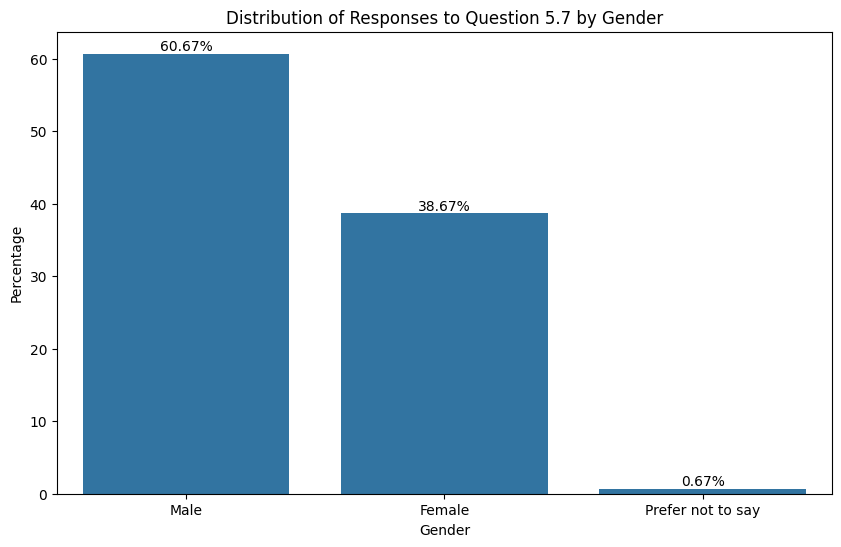

In [ ]:
gender_counts = df['Gender'].value_counts()

# Calculate percentages
total_responses = gender_counts.sum()
percentage_male = (gender_counts.get(1, 0) / total_responses) * 100
percentage_female = (gender_counts.get(0, 0) / total_responses) * 100
percentage_prefer_not_to_say = (gender_counts.get('Prefer not to say', 0) / total_responses) * 100

# Plotting the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=['Male', 'Female', 'Prefer not to say'],
            y=[percentage_male, percentage_female, percentage_prefer_not_to_say])
plt.title('Distribution of Responses to Question 5.7 by Gender')
plt.ylabel('Percentage')
plt.xlabel('Gender')

# Adding percentage labels on top of each bar
for index, value in enumerate([percentage_male, percentage_female, percentage_prefer_not_to_say]):
    plt.text(index, value, f'{value:.2f}%', ha='center', va='bottom', fontsize=10)

plt.show()

In [ ]:
# Mapping gender responses to actual labels
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Grouping by recommendation and gender, and then calculating the percentage of each gender
gender_percentage = df.groupby('Gender').sum() / df.groupby('Gender').count() * 100

# Transpose the DataFrame for plotting
gender_percentage = gender_percentage.T

# Plotting the stacked horizontal bar chart
plt.figure(figsize=(10, 8))
gender_percentage.plot(kind='barh', stacked=True, color=['skyblue', 'lightcoral', 'lightgreen'])
plt.xlabel('Percentage')
plt.ylabel('Recommendation')
plt.title('Gender Contribution for Each Recommendation')
plt.legend(title='Gender')
plt.xticks(range(0, 101, 10))
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()  # Invert y-axis to display recommendations from top to bottom
plt.show()

### Ingore the chart after the code below

<ipython-input-6-3223d55ea2c5>:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gender_percentage = df.groupby('Gender').sum() / df.groupby('Gender').count() * 100


<Figure size 1000x800 with 0 Axes>

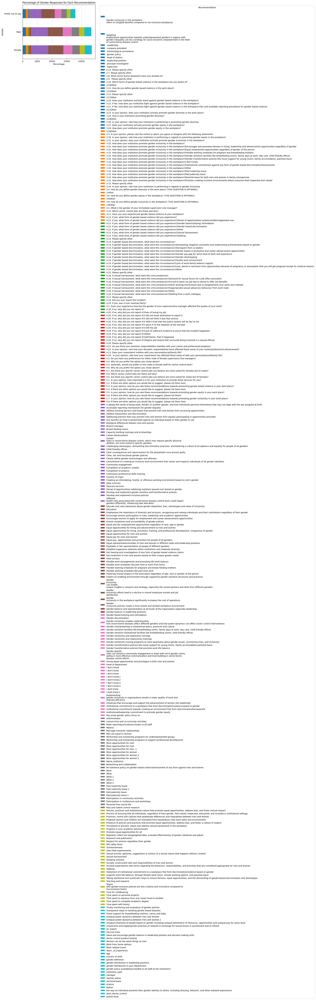

In [ ]:
# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Calculate the percentage of each gender for each recommendation
gender_percentage = df.groupby('Gender').sum() / df.groupby('Gender').count() * 100

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 8))
gender_percentage.plot(kind='barh', stacked=True, cmap='tab10')
plt.xlabel('Percentage')
plt.ylabel('Gender')
plt.title('Percentage of Gender Responses for Each Recommendation')
plt.legend(title='Recommendation', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

# 5.7. In your opinion, how do you rate these recommendations towards promoting gender inclusivity in your work place?

<Figure size 1000x800 with 0 Axes>

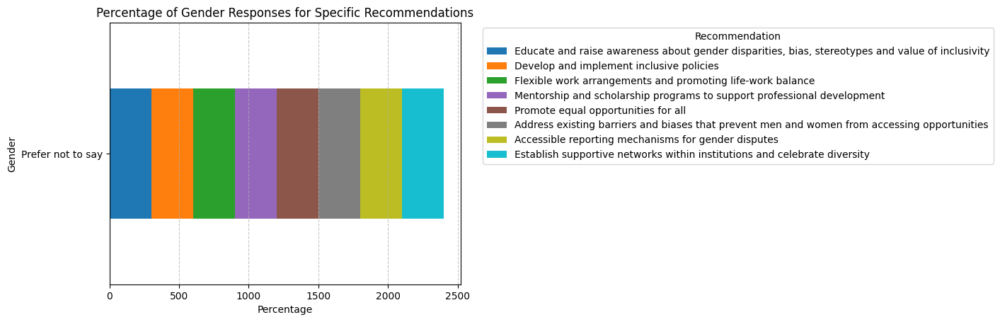

In [ ]:
# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disaggregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of each gender for the specific columns
gender_percentage_specific = df.groupby('Gender')[specific_columns].sum() / df.groupby('Gender')[specific_columns].count() * 100

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 8))
gender_percentage_specific.plot(kind='barh', stacked=True, cmap='tab10')
plt.xlabel('Percentage')
plt.ylabel('Gender')
plt.title('Percentage of Gender Responses for Specific Recommendations')
plt.legend(title='Recommendation', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

<Figure size 1000x800 with 0 Axes>

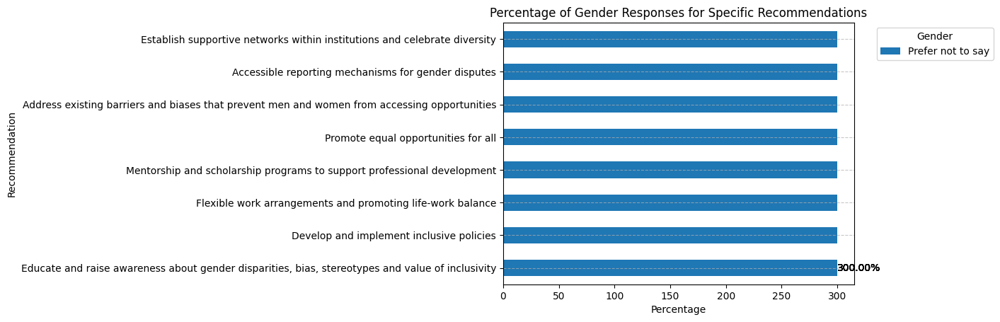

In [ ]:
# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disaggregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of each gender for the specific columns
gender_percentage_specific = df.groupby('Gender')[specific_columns].sum() / df.groupby('Gender')[specific_columns].count() * 100

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 8))
gender_percentage_specific.T.plot(kind='barh', stacked=True, cmap='tab10')
plt.ylabel('Recommendation')
plt.xlabel('Percentage')
plt.title('Percentage of Gender Responses for Specific Recommendations')
plt.legend(title='Gender', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotating bars with specific columns and responses
for i, val in enumerate(gender_percentage_specific.values):
    for j, subval in enumerate(val):
        plt.text(subval, i, f'{subval:.2f}%', ha='left', va='center', color='black')

plt.show()

# Loading the dataset

In [ ]:
#Loading the dataset
from google.colab import files
uploaded = files.upload()

# EDA

In [ ]:
df.shape # The dataset has 150 rows and 299 columns/features

(150, 299)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Columns: 299 entries, Country of origin to 5.8. If there are other options you would like to suggest, please list them here
dtypes: float64(159), int64(74), object(66)
memory usage: 350.5+ KB


# Data set sections
## Demographic Information,
## Attitudes and Perceptions,
## Institutional Policies and Practices
## Personal Experiences, Impact of Gender on Work
## Balancing Work and Domestic Responsibilities
## Recommendations and Ratings

In [ ]:
# Demographic Information
demographic_info = df[['Country', 'Workplace', 'Age', 'Gender', 'Marital Status', 'Education', 'Years of Experience']]

# Work Experience and Roles
work_experience_roles = df[['Work Experience', 'Leadership Position', 'Vector-Borne Diseases Worked On']]

# Attitudes and Perceptions
attitudes_perceptions = df[['Gender Specific Roles', 'Inclusivity Policies', 'Gender-Based Violence',
                                'Promotion of Gender Diversity', 'Equity and Inclusivity']]

# Institutional Policies and Practices
institutional_policies_practices = df[['Gender Policies', 'Actions Against Gender-Based Violence',
                                           'Efforts to Promote Gender Diversity', 'Equity and Inclusivity']]

# Personal Experiences
personal_experiences = df[['Experienced Gender-Based Violence', 'Discrimination or Harassment Experienced',
                                'Reporting of Incidents']]

# Impact of Gender on Work
gender_impact_work = df[['Influence of Gender on Work Quality', 'Preferences for Supervisors',
                              'Hiring Preferences', 'Perceptions of Gender Suitability for Job Roles']]

# Balancing Work and Domestic Responsibilities
work_domestic_responsibilities = df[['Impact of Domestic Responsibilities on Career Progression',
                                          'Work-Life Balance']]

# Recommendations and Ratings
recommendations_ratings = df[['Importance of Services', 'Policies', 'Recommendations']]

In [ ]:
# Mapping for Gender and Education columns
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
education_mapping = {4: 'PhD', 3: 'MSc', 2: 'BSc', 1: 'Diploma', 0: 'College'}

# Apply mapping to Gender and Education columns
df['Gender'] = df['Gender'].map(gender_mapping)
df['Education'] = df['Education'].map(education_mapping)

In [ ]:
# Summary statistics
summary_stats = df[['age', 'Years _of_Experience']].describe()
summary_stats

,Years _of_Experience
count,135.000000
mean,2.014815
std,0.828460
min,1.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,4.000000


# Gneder distribution by Demographic Information

In [ ]:
# Demographic Information
demographic_info = df[['country of work', 'Name_Institution', 'age', 'Gender', 'marital_status', 'Education', 'Years _of_Experience']]

In [ ]:
# Summary statistics for Age and Years of Experience
summary_stats = demographic_info[['age', 'Years _of_Experience']].describe()
print("Summary statistics for Age and Years of Experience:")
print(summary_stats)

Summary statistics for Age and Years of Experience:
       Years _of_Experience
count            135.000000
mean               2.014815
std                0.828460
min                1.000000
25%                1.000000
50%                2.000000
75%                3.000000
max                4.000000


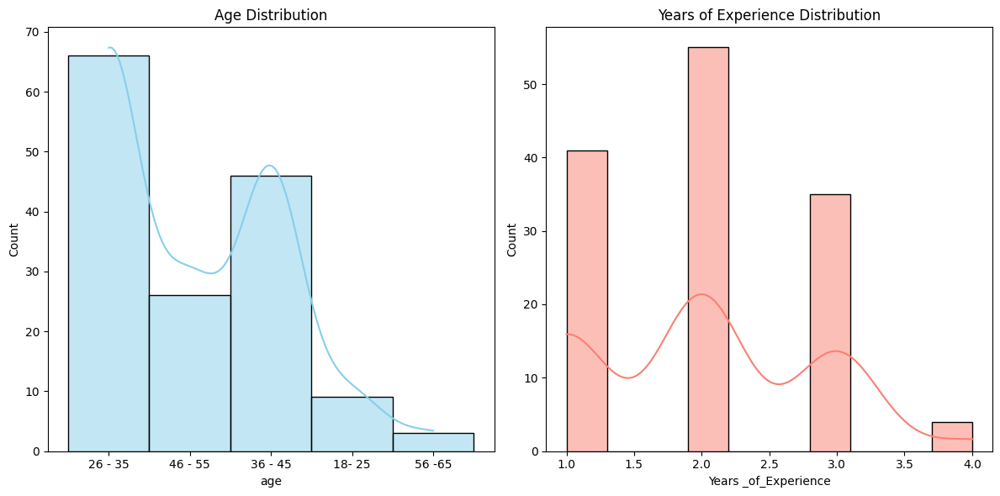

In [ ]:
# Visualizations for Age and Years of Experience

plt.figure(figsize=(12, 6))

# Age distribution
plt.subplot(1, 2, 1)
sns.histplot(demographic_info['age'], bins=10, kde=True, color='skyblue')
plt.title('Age Distribution')

# Years of Experience distribution
plt.subplot(1, 2, 2)
sns.histplot(demographic_info['Years _of_Experience'], bins=10, kde=True, color='salmon')
plt.title('Years of Experience Distribution')

plt.tight_layout()
plt.show()

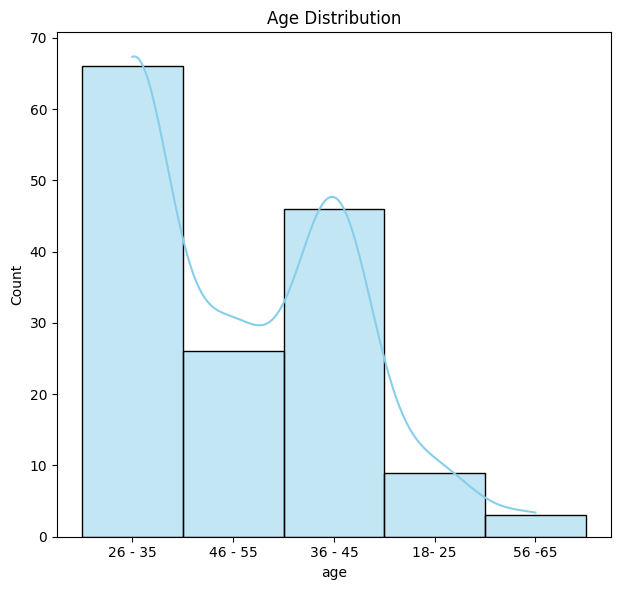

In [ ]:
# Age distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['age'], bins=10, kde=True, color='skyblue')
plt.title('Age Distribution')
plt.tight_layout()
plt.show()

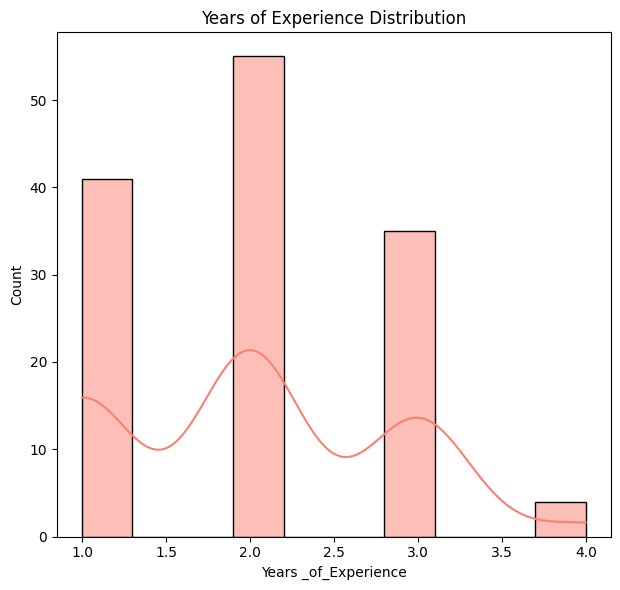

In [ ]:
# Years of Experience distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
sns.histplot(df['Years _of_Experience'], bins=10, kde=True, color='salmon')
plt.title('Years of Experience Distribution')
plt.tight_layout()
plt.show()

## Data anlytsis processes used


Will start with importing the data, checking for missing values, and removing duplicates; then, summary tables are created by gender to calculate counts and percentages, helping identify variables for further visualization to explore potential gender differences, followed by the visualization of selected variables using appropriate plots, such as bar plots for categorical variables with gender breakdowns.

## Data loading and cleaning

In [ ]:
#Importing Data
df = pd.read_excel('gnd.xlsx')

In [ ]:
#Checking for Missing Values
missing_values = df.isnull().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
Country of origin                                                                                      0
country of work                                                                                        0
institution_type                                                                                       0
Name_Institution                                                                                       0
age                                                                                                    0
                                                                                                    ... 
Address existing barriers and biases that prevent men and women from accessing opportunities           0
Accessible reporting mechanisms for gender disputes                                                    0
Establish supportive networks within institutions and celebrate diversity                              0
Regularly collect sex disagregated data

In [ ]:
#Checking for Duplicates
duplicates = df.duplicated().sum()
print("Number of duplicates:", duplicates)

Number of duplicates: 0


In [ ]:
#Removing Duplicates
data = df.drop_duplicates()

In [ ]:
df.shape

(150, 299)

# Exploring the Data #Summary Statistics

In [ ]:
#Exploring the Data #Summary Statistics
summary_stats = df.describe()
print("\nSummary Statistics:")
print(summary_stats)


Summary Statistics:
        Education  work_Vector_control  Semi field experiements  \
count  150.000000           150.000000               135.000000   
mean     2.526667             0.900000                 0.325926   
std      1.040758             0.301005                 0.470465   
min      0.000000             0.000000                 0.000000   
25%      2.000000             1.000000                 0.000000   
50%      3.000000             1.000000                 0.000000   
75%      3.000000             1.000000                 1.000000   
max      4.000000             1.000000                 1.000000   

       Vaccine trials  Vector control product testing  Field surveys  \
count      135.000000                      135.000000     135.000000   
mean         0.007407                        0.400000       0.466667   
std          0.086066                        0.491723       0.500746   
min          0.000000                        0.000000       0.000000   
25%          0.

# #Distribution of Numerical Variables

In [ ]:
#Distribution of Numerical Variables
numerical_vars = df.select_dtypes(include='number').columns.tolist()
for var in numerical_vars:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[var], kde=True)
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
#Relationships between Variables (Scatter Plots)
sns.pairplot(df, diag_kind='kde')
plt.show()

In [ ]:
#Visualizing the Data. Looking at the Bar Plot of Categorical Variables
categorical_vars = df.select_dtypes(include='object').columns.tolist()
for var in categorical_vars:
    plt.figure(figsize=(8, 4))
    sns.countplot(df[var])
    plt.title(f'Count of {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

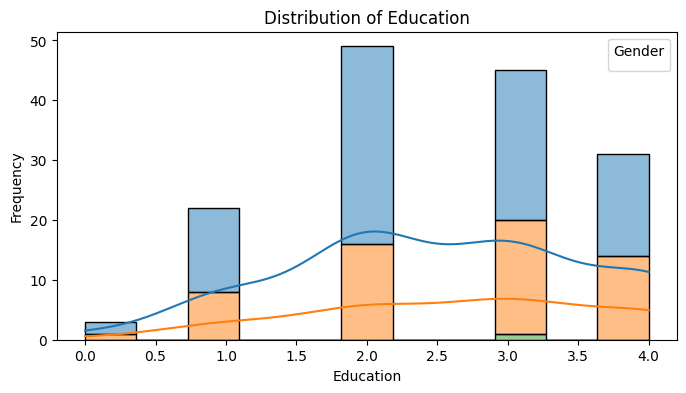

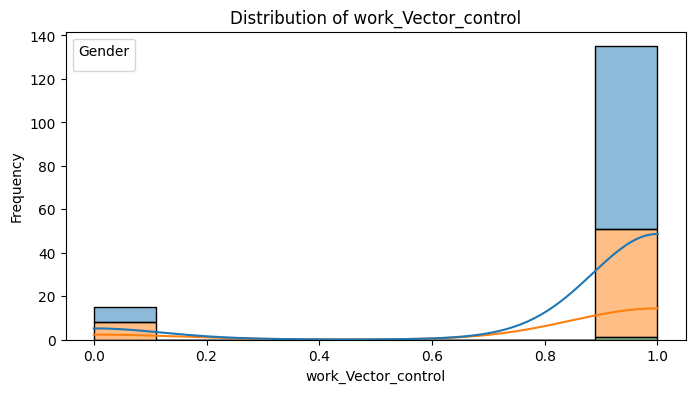

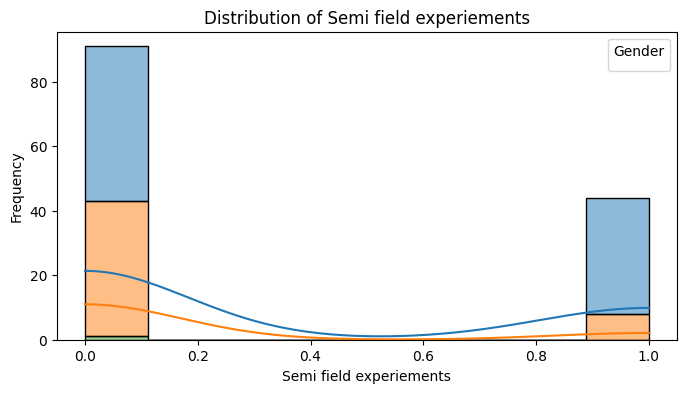

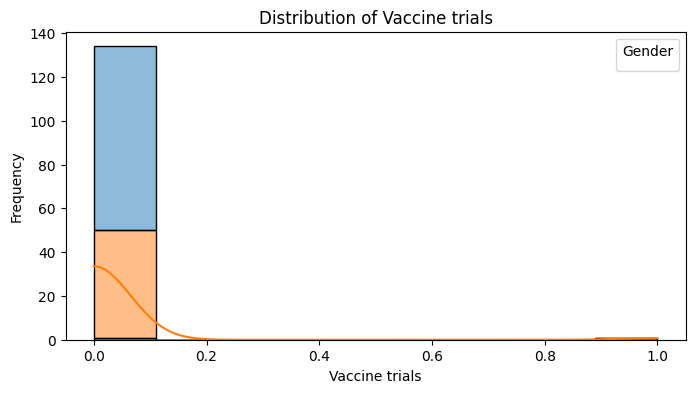

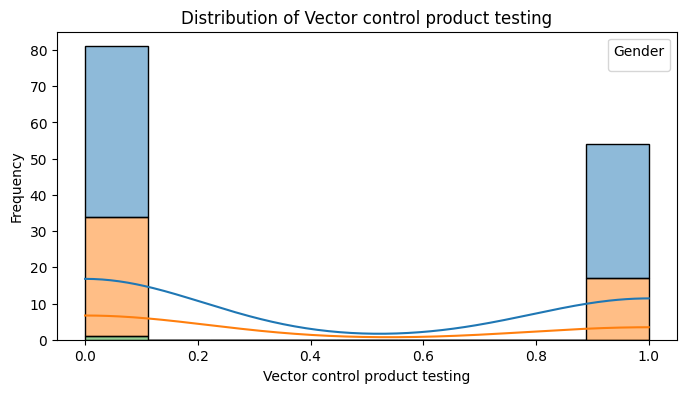

...

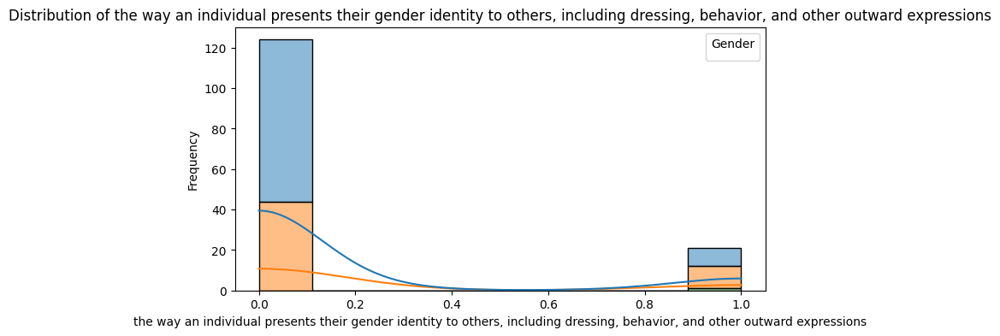

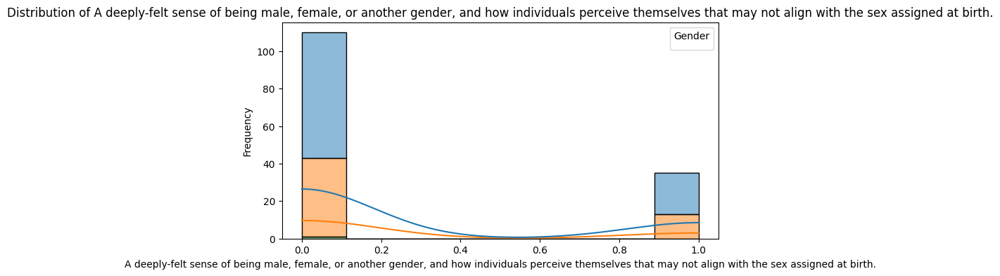

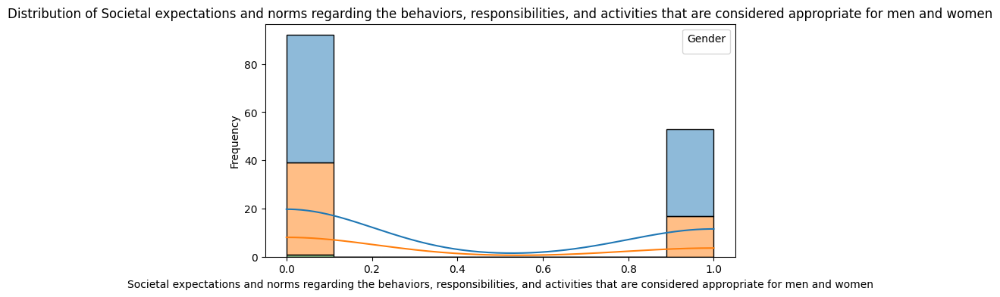

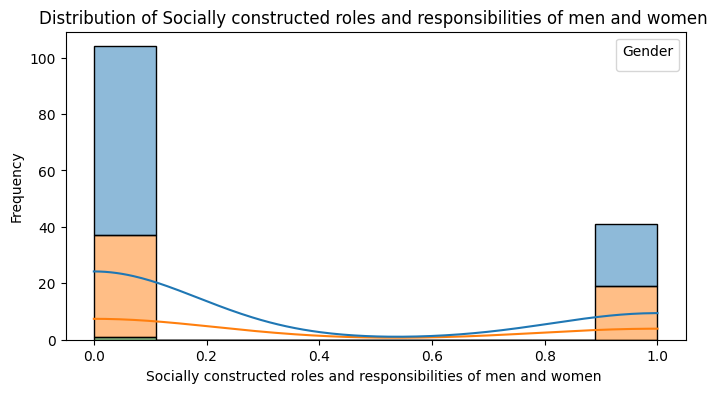

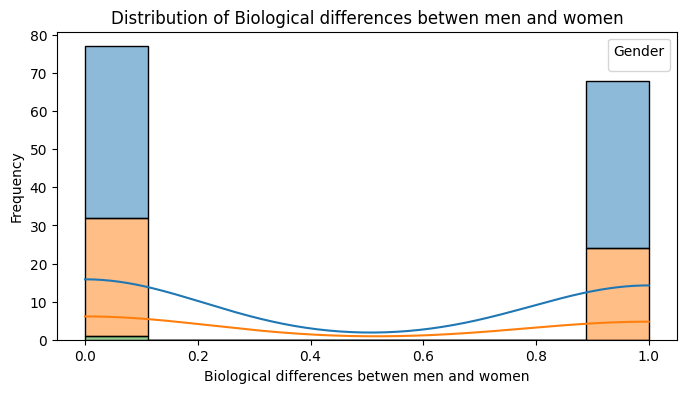

LinAlgError: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.

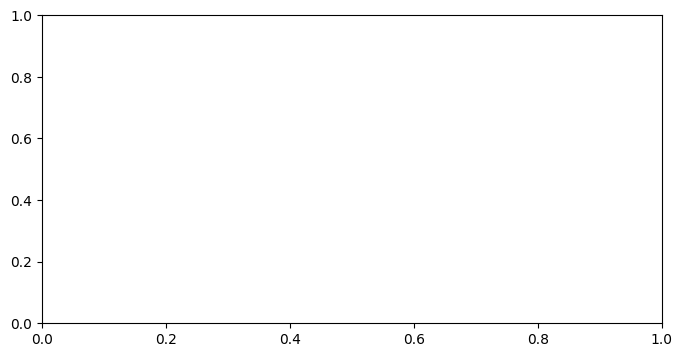

In [ ]:
# Distribution of Numerical Variables
numerical_vars = df.select_dtypes(include='number').columns.tolist()
for var in numerical_vars:
    plt.figure(figsize=(8, 4))
    sns.histplot(data=df, x=var, kde=True, hue='Gender', multiple='stack')
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.legend(title='Gender')
    plt.show()

## Visualizing the Data: Bar Plot of Categorical Variables
### This code below with take time to run

In [ ]:
# Visualizing the Data: Bar Plot of Categorical Variables
categorical_vars = df.select_dtypes(include='object').columns.tolist()
for var in categorical_vars:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df, x=var, hue='Gender')
    plt.title(f'Count of {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Gender')
    plt.show()

## Data leaning before creating likert charts

#Loading the dataset


In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:

# Step 1: Import Data
df = pd.read_excel('gnd.xlsx')

# Step 2: Check for missing values
missing_values = df.isnull().sum()
print("Missing Values:")
print(missing_values)

# Step 3: Check for duplicates
duplicates = df.duplicated().sum()
print("Number of duplicates:", duplicates)

# Remove duplicates
data = df.drop_duplicates()

# Step 4: Create Summary Tables by Gender
gender_summary = df.groupby('Gender').size().reset_index(name='Count')
total_count = gender_summary['Count'].sum()
gender_summary['Percentage'] = (gender_summary['Count'] / total_count) * 100
print("\nSummary Table by Gender:")
print(gender_summary)

# Step 5: Explore the data further
# Here, you can decide which variables might need visualization based on the summary tables and other considerations.
# For example, if certain variables show interesting differences between genders, you might want to visualize those.

# Step 6: Visualize the data (if needed)
# Example: Bar plot of categorical variables
# categorical_vars = ['Variable1', 'Variable2', ...]  # Specify categorical variables of interest
# for var in categorical_vars:
#     plt.figure(figsize=(8, 4))
#     sns.countplot(x=var, hue='Gender', data=df)
#     plt.title(f'Count of {var} by Gender')
#     plt.xlabel(var)
#     plt.ylabel('Count')
#     plt.xticks(rotation=45)
#     plt.legend(title='Gender')
#     plt.show()


## Likert scale charts


## 5.5. In your opinion, how do you rate these recommendations towards promoting gender equity in your work place?

In [ ]:
#Loading the dataset
from google.colab import files
uploaded = files.upload()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Create a grouped bar plot for each specific column
for var in specific_columns:
    plt.figure(figsize=(10, 6))
    data = df.groupby('Gender')[var].value_counts(normalize=True).unstack().fillna(0)
    x = np.arange(len(data.columns))
    width = 0.3

    for i, gender in enumerate(data.index):
        plt.bar(x + (i - 1) * width, data.loc[gender], width=width, label=gender)

    plt.xlabel('Rating')
    plt.ylabel('Proportion')
    plt.title(f'Distribution of {var}')
    plt.xticks(x, data.columns)
    plt.legend(title='Gender')
    plt.tight_layout()
    plt.show()

### Combining all the charts into one stacked chart

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Create subplots for all specific columns
num_plots = len(specific_columns)
num_rows = num_plots // 2 + num_plots % 2  # Adjust the number of rows for odd number of plots
fig, axes = plt.subplots(num_rows, 2, figsize=(15, 8))

for i, var in enumerate(specific_columns):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    data = df.groupby('Gender')[var].value_counts(normalize=True).unstack().fillna(0)
    x = np.arange(len(data.columns))
    width = 0.3

    for j, gender in enumerate(data.index):
        ax.bar(x + (j - 1) * width, data.loc[gender], width=width, label=gender)

    ax.set_xlabel('Rating')
    ax.set_ylabel('Proportion')
    ax.set_title(f'Distribution of {var}')
    ax.set_xticks(x)
    ax.set_xticklabels(data.columns)
    ax.legend(title='Gender')

# Adjust layout
plt.tight_layout()
plt.show()


# 5.5. In your opinion, how do you rate these recommendations towards promoting gender equity in your work place?

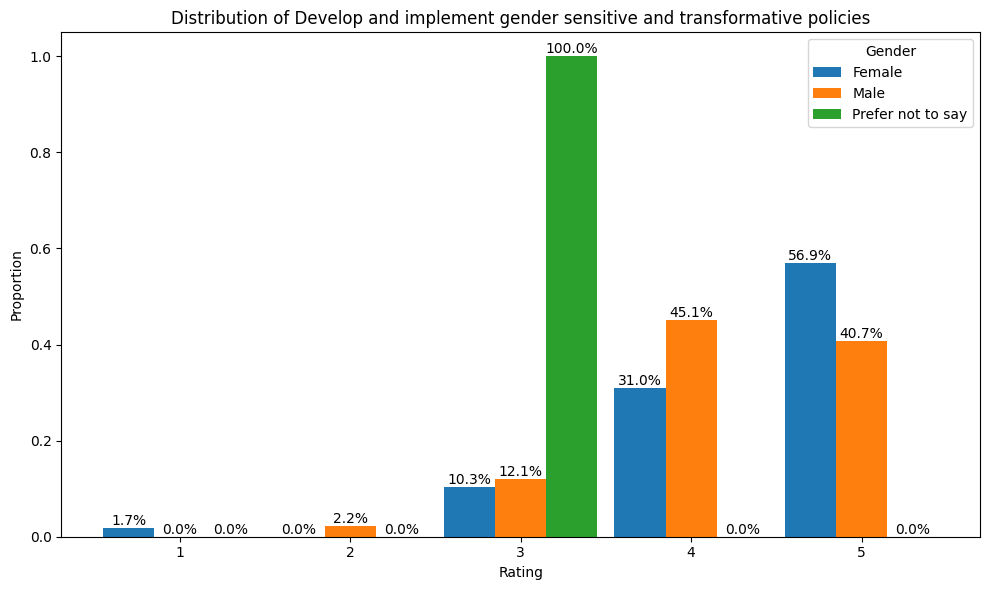

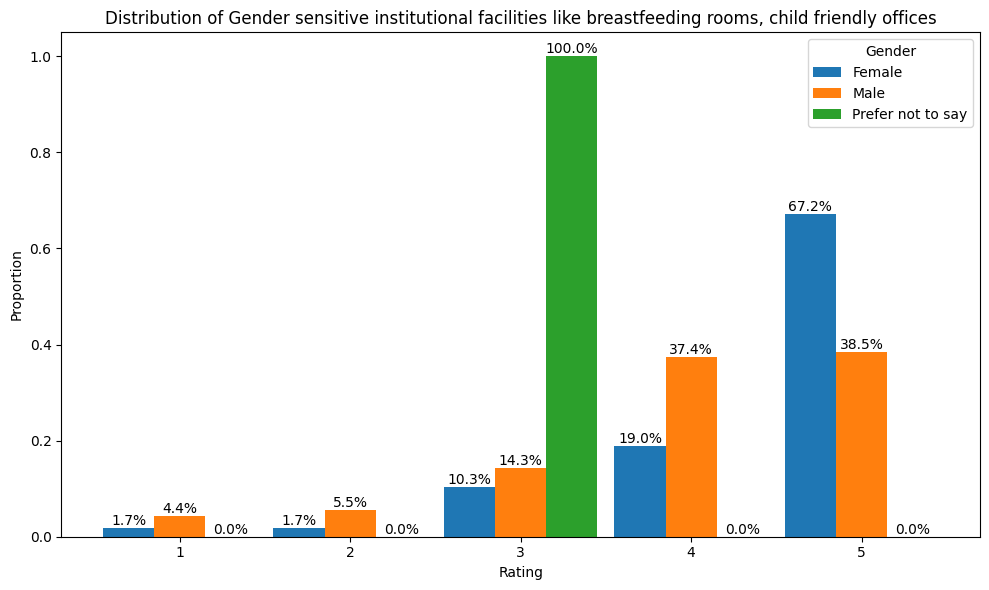

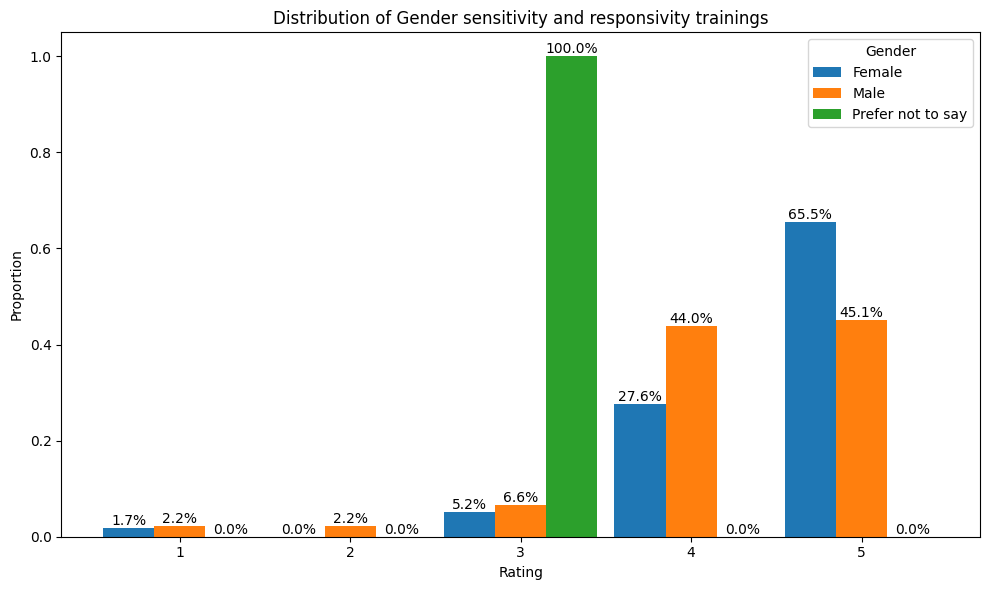

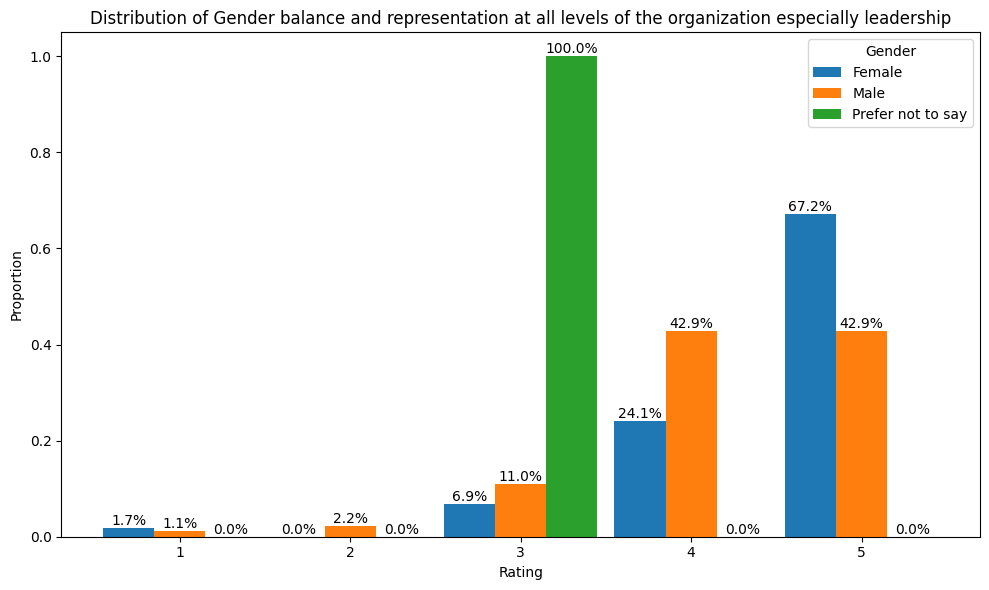

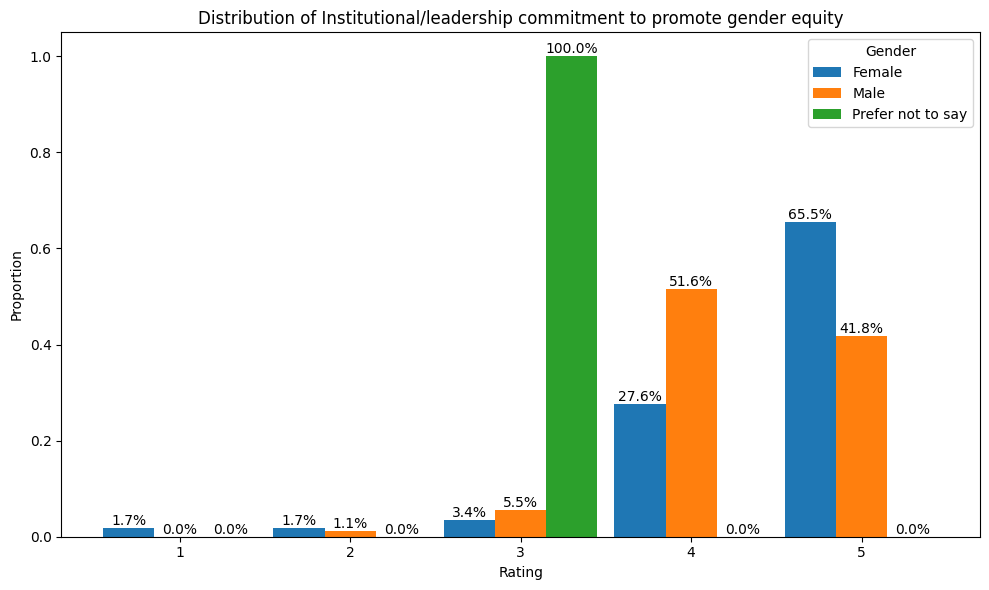

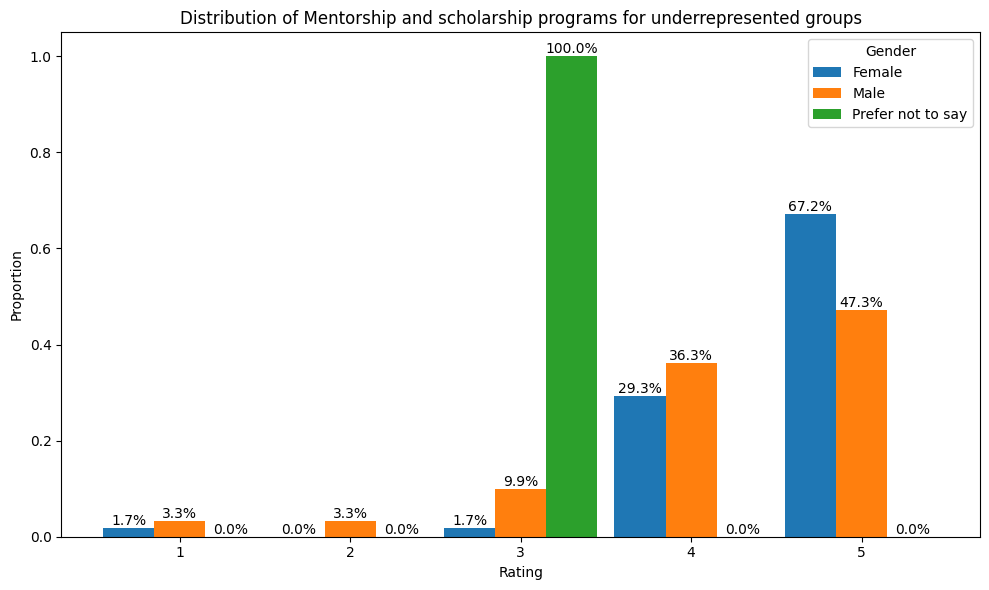

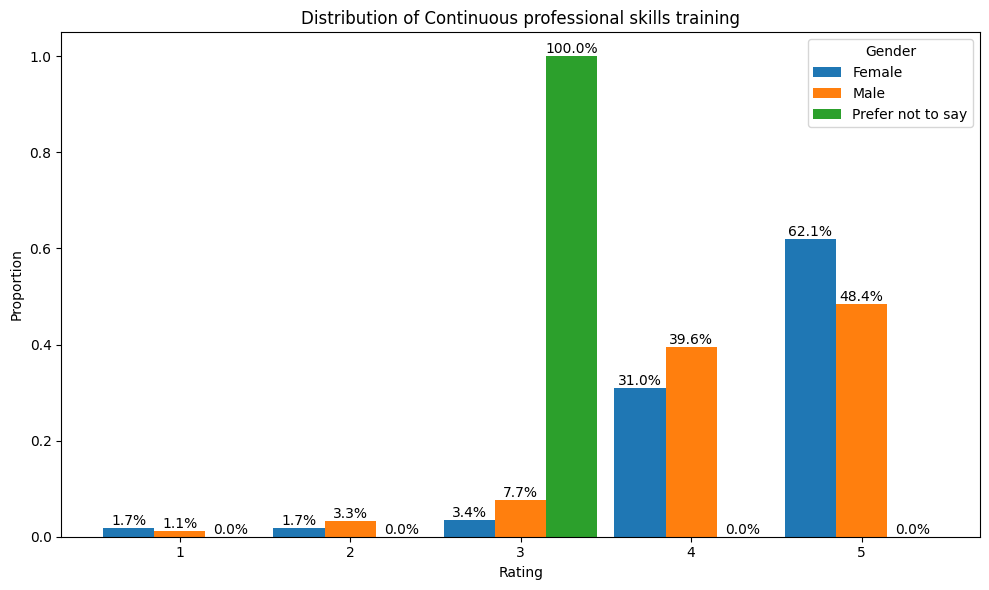

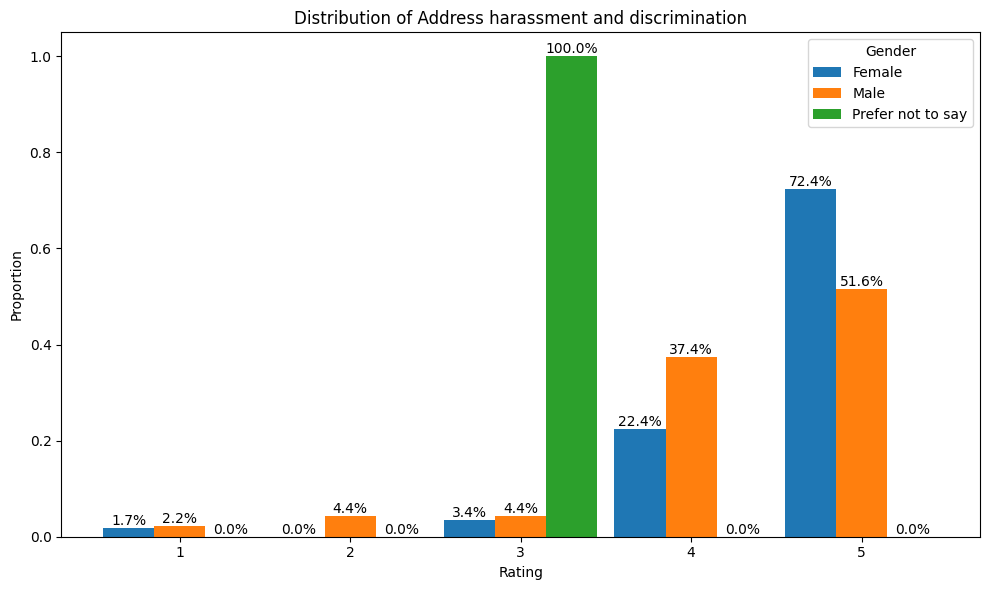

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Create a grouped bar plot for each specific column
for var in specific_columns:
    plt.figure(figsize=(10, 6))
    data = df.groupby('Gender')[var].value_counts(normalize=True).unstack().fillna(0)
    x = np.arange(len(data.columns))
    width = 0.3

    for i, gender in enumerate(data.index):
        plt.bar(x + (i - 1) * width, data.loc[gender], width=width, label=gender)
        for j, val in enumerate(data.loc[gender]):
            plt.text(x[j] + (i - 1) * width, val, f'{val:.1%}', ha='center', va='bottom')

    plt.xlabel('Rating')
    plt.ylabel('Proportion')
    plt.title(f'Distribution of {var}')
    plt.xticks(x, data.columns)
    plt.legend(title='Gender')
    plt.tight_layout()
    plt.show()


# 5.5. In your opinion, how do you rate these recommendations towards promoting gender equity in your work place?

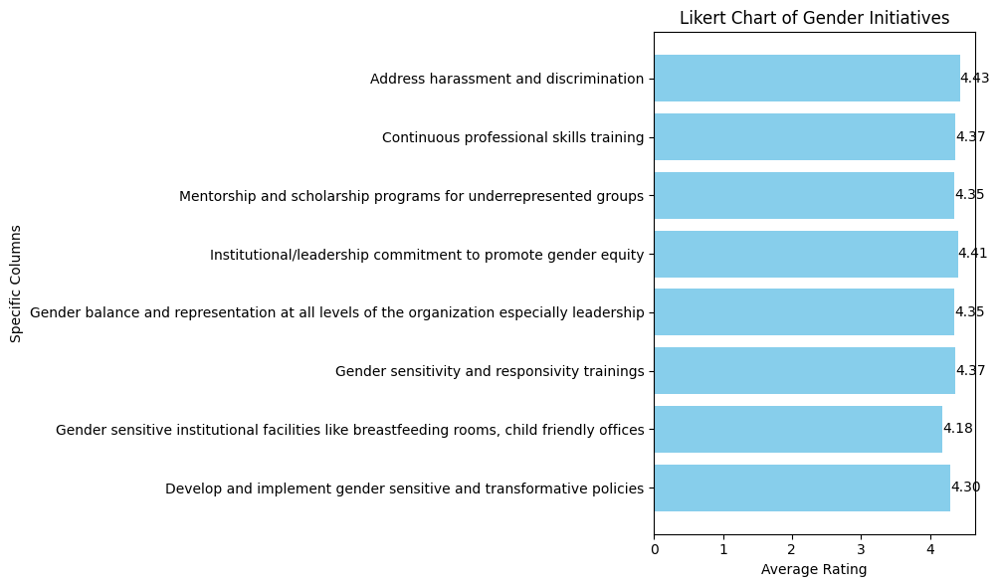

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the average rating for each specific column
avg_ratings = df[specific_columns].mean()

# Plotting the Likert chart
plt.figure(figsize=(10, 6))
bars = plt.barh(avg_ratings.index, avg_ratings.values, color='skyblue')

# Adding data labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{bar.get_width():.2f}', ha='left', va='center')

# Adding labels and title
plt.xlabel('Average Rating')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives')

# Displaying the plot
plt.tight_layout()
plt.show()


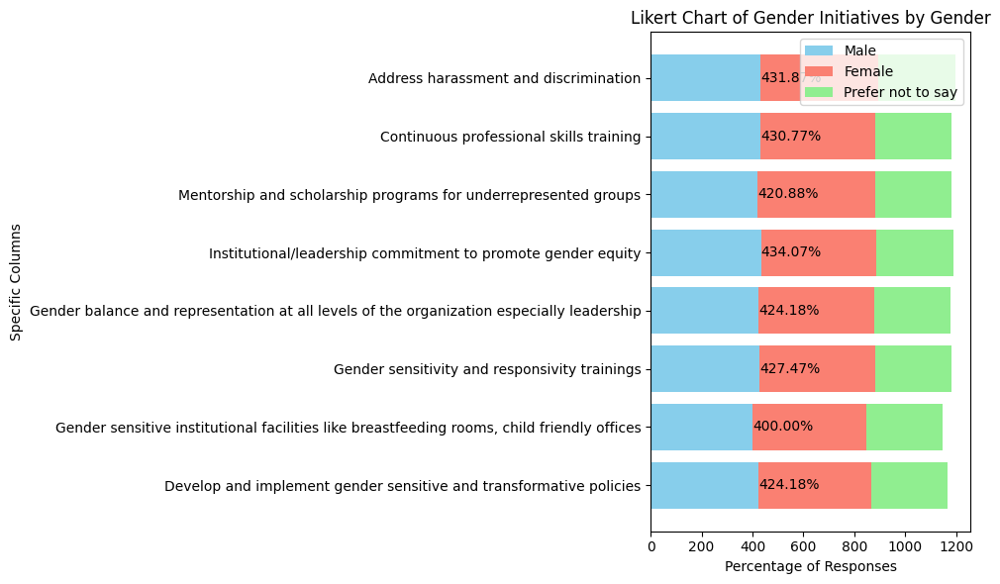

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of responses for each gender type for each column
gender_percentages = df.groupby('Gender')[specific_columns].mean() * 100

# Plotting the Likert chart with percentages
plt.figure(figsize=(10, 6))
bars = plt.barh(gender_percentages.columns, gender_percentages.loc['Male'], color='skyblue', label='Male')
plt.barh(gender_percentages.columns, gender_percentages.loc['Female'], left=gender_percentages.loc['Male'], color='salmon', label='Female')
plt.barh(gender_percentages.columns, gender_percentages.loc['Prefer not to say'], left=gender_percentages.loc['Male'] + gender_percentages.loc['Female'], color='lightgreen', label='Prefer not to say')

# Adding percentages on bars
for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height() / 2, f'{width:.2f}%', ha='left', va='center')

# Adding labels and title
plt.xlabel('Percentage of Responses')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives by Gender')
plt.legend()

# Displaying the plot
plt.tight_layout()
plt.show()


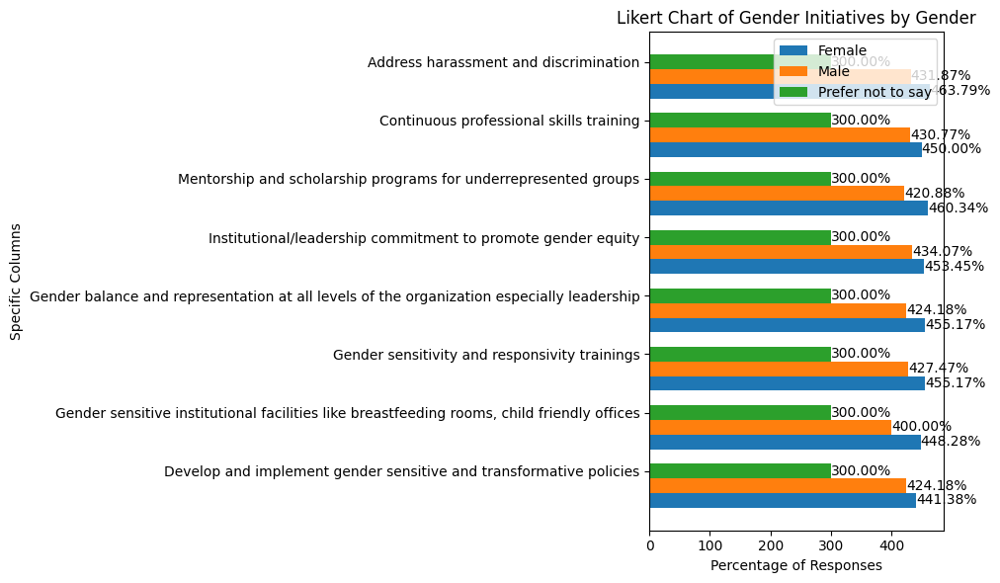

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of responses for each gender type for each column
gender_percentages = df.groupby('Gender')[specific_columns].mean() * 100

# Plotting the Likert chart with percentages
plt.figure(figsize=(10, 6))
bar_width = 0.25
bar_positions = range(len(gender_percentages.columns))

for i, gender in enumerate(gender_percentages.index):
    plt.barh([pos + i * bar_width for pos in bar_positions], gender_percentages.loc[gender], height=bar_width, label=gender)

# Adding percentages on bars
for i, gender in enumerate(gender_percentages.index):
    for j, percentage in enumerate(gender_percentages.loc[gender]):
        plt.text(percentage, j + i * bar_width, f'{percentage:.2f}%', ha='left', va='center')

# Adding labels and title
plt.xlabel('Percentage of Responses')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives by Gender')
plt.yticks([pos + 0.5 for pos in bar_positions], gender_percentages.columns)
plt.legend()

# Displaying the plot
plt.tight_layout()
plt.show()


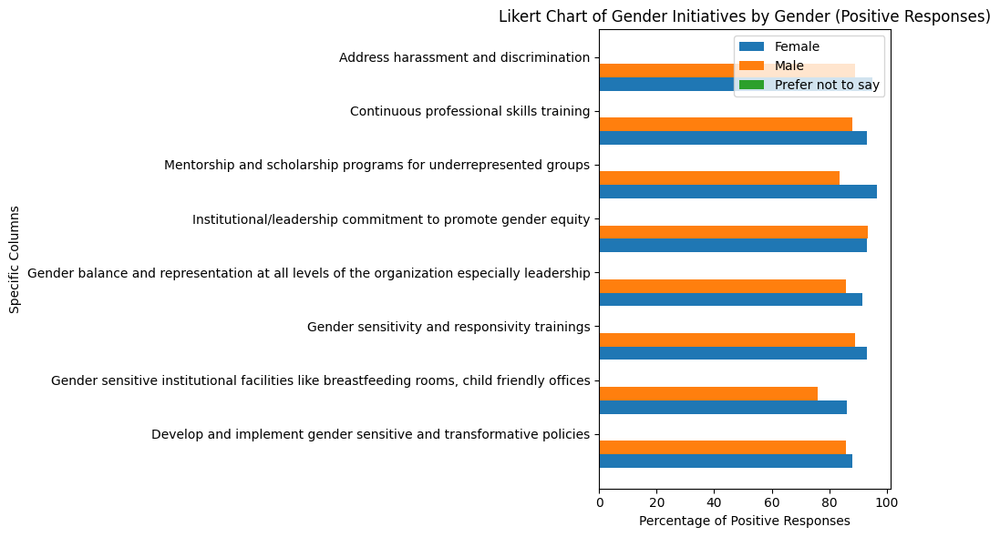

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of responses rated 4 or 5 for each gender type for each column
positive_responses = df[specific_columns].apply(lambda x: x.isin([4, 5])).groupby(df['Gender']).mean() * 100

# Plotting the Likert chart with percentages of positive responses
plt.figure(figsize=(10, 6))
bar_width = 0.25
bar_positions = range(len(positive_responses.columns))

for i, gender in enumerate(positive_responses.index):
    plt.barh([pos + i * bar_width for pos in bar_positions], positive_responses.loc[gender], height=bar_width, label=gender)

# Adding labels and title
plt.xlabel('Percentage of Positive Responses')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives by Gender (Positive Responses)')
plt.yticks([pos + 0.5 for pos in bar_positions], positive_responses.columns)
plt.legend()

# Displaying the plot
plt.tight_layout()
plt.show()


The chart illustrates the percentage of positive responses from different gender groups to various workplace gender equity recommendations, offering insight into the perceived effectiveness of these initiatives.

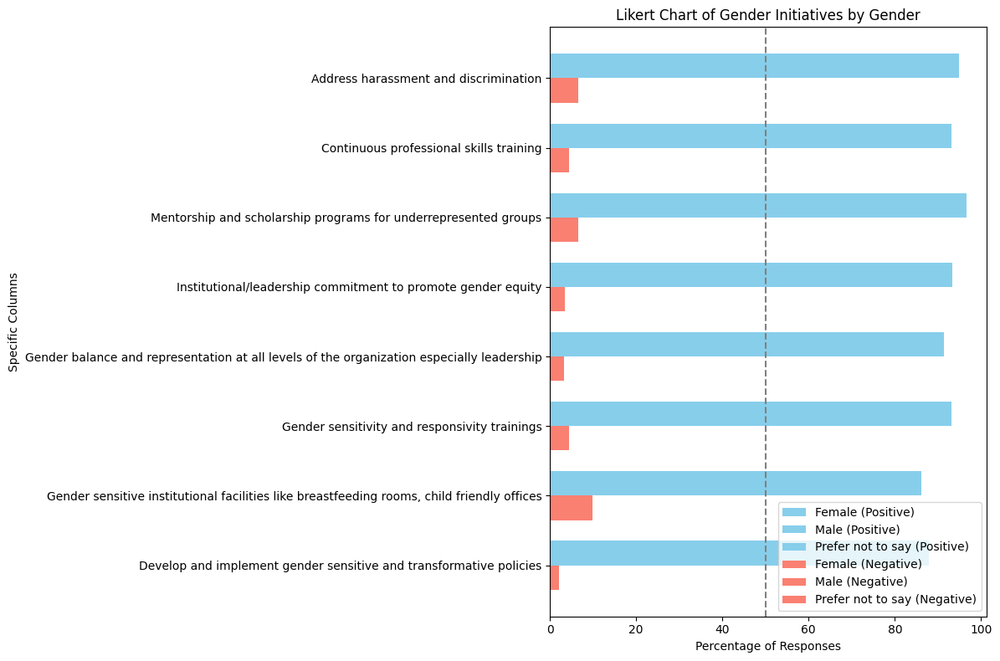

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of positive responses (rated 4 or 5) for each gender type for each column
positive_responses = df[specific_columns].apply(lambda x: x.isin([4, 5])).groupby(df['Gender']).mean() * 100

# Calculate the percentage of negative responses (rated 1 or 2) for each gender type for each column
negative_responses = df[specific_columns].apply(lambda x: x.isin([1, 2])).groupby(df['Gender']).mean() * 100

# Plotting the Likert chart with percentages of positive and negative responses
plt.figure(figsize=(12, 8))
bar_width = 0.35
bar_positions = range(len(positive_responses.columns))

# Plotting positive responses
for i, gender in enumerate(positive_responses.index):
    plt.barh([pos + bar_width for pos in bar_positions], positive_responses.loc[gender], height=bar_width, label=f'{gender} (Positive)', color='skyblue')

# Plotting negative responses
for i, gender in enumerate(negative_responses.index):
    plt.barh(bar_positions, negative_responses.loc[gender], height=bar_width, label=f'{gender} (Negative)', color='salmon')

# Adding labels and title
plt.xlabel('Percentage of Responses')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives by Gender')
plt.yticks([pos + bar_width / 2 for pos in bar_positions], positive_responses.columns)
plt.legend()

# Adding vertical lines for neutral point (3)
plt.axvline(x=50, color='gray', linestyle='--')

# Displaying the plot
plt.tight_layout()
plt.show()


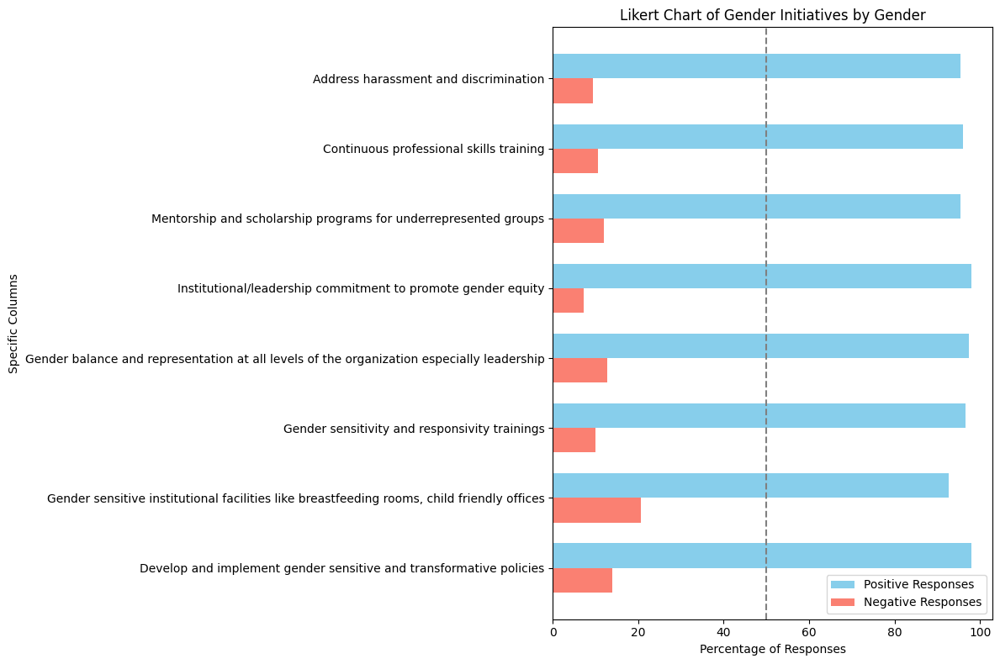

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of responses rated 3 and below for each gender type for each column
negative_responses = df[specific_columns].apply(lambda x: (x <= 3).mean() * 100)

# Calculate the percentage of responses rated 3 to 5 for each gender type for each column
positive_responses = df[specific_columns].apply(lambda x: ((x >= 3) & (x <= 5)).mean() * 100)

# Plotting the Likert chart with percentages of positive and negative responses
plt.figure(figsize=(12, 8))
bar_width = 0.35
bar_positions = range(len(positive_responses))

# Plotting positive responses on the positive x-axis
plt.barh([pos + bar_width for pos in bar_positions], positive_responses, height=bar_width, label='Positive Responses', color='skyblue')

# Plotting negative responses on the negative x-axis
plt.barh(bar_positions, negative_responses, height=bar_width, label='Negative Responses', color='salmon')

# Adding labels and title
plt.xlabel('Percentage of Responses')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives by Gender')
plt.yticks([pos + bar_width / 2 for pos in bar_positions], specific_columns)
plt.legend()

# Adding vertical lines for neutral point (3)
plt.axvline(x=50, color='gray', linestyle='--')

# Displaying the plot
plt.tight_layout()
plt.show()


# 5.5. In your opinion, how do you rate these recommendations towards promoting gender equity in your work place?

#loading the dataset

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Develop and implement gender sensitive and transformative policies",
    "Flexible work schedules like part time or work from home",
    "Gender sensitive institutional facilities like breastfeeding rooms, child friendly offices",
    "Gender sensitivity and responsivity trainings",
    "Gender balance and representation at all levels of the organization especially leadership",
    "Institutional/leadership commitment to promote gender equity",
    "Mentorship and scholarship programs for underrepresented groups",
    "Continuous professional skills training",
    "Address harassment and discrimination"
]

# Correcting the column names if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Calculate the percentage of positive responses (rated 4 or 5) for each gender type for each column
positive_responses = df[specific_columns].apply(lambda x: x.isin([4, 5])).groupby(df['Gender']).mean() * 100

# Calculate the percentage of negative responses (rated 1 or 2) for each gender type for each column
negative_responses = df[specific_columns].apply(lambda x: x.isin([1, 2])).groupby(df['Gender']).mean() * 100

# Plotting the Likert chart with percentages of positive and negative responses
plt.figure(figsize=(12, 8))
bar_width = 0.35
bar_positions = range(len(positive_responses.columns))

# Plotting positive responses
for i, gender in enumerate(positive_responses.index):
    plt.barh([pos + bar_width for pos in bar_positions], positive_responses.loc[gender], height=bar_width, label=f'{gender} (Positive)', color='skyblue')

# Plotting negative responses
for i, gender in enumerate(negative_responses.index):
    plt.barh(bar_positions, negative_responses.loc[gender], height=bar_width, label=f'{gender} (Negative)', color='salmon')

# Adding labels and title
plt.xlabel('Percentage of Responses')
plt.ylabel('Specific Columns')
plt.title('Likert Chart of Gender Initiatives by Gender')
plt.yticks([pos + bar_width / 2 for pos in bar_positions], specific_columns)
plt.legend()

# Adding vertical lines for neutral point (3)
plt.axvline(x=50, color='gray', linestyle='--')

# Displaying the plot
plt.tight_layout()
plt.show()


## 5.7. In your opinion, how do you rate these recommendations towards promoting gender inclusivity in your work place?

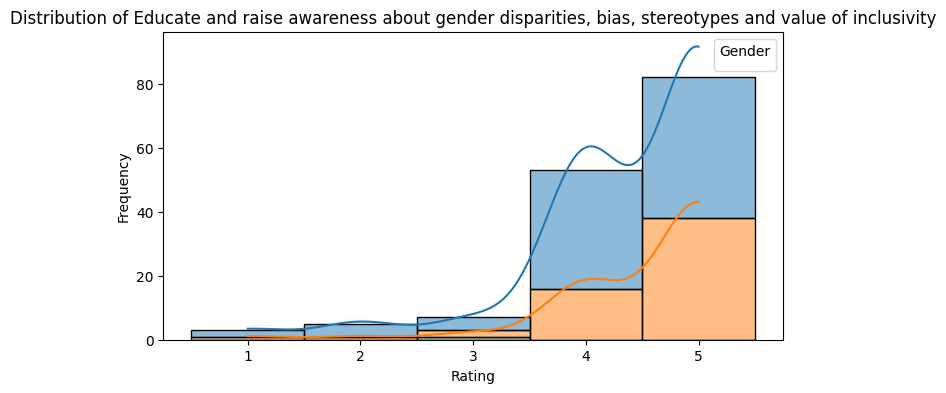

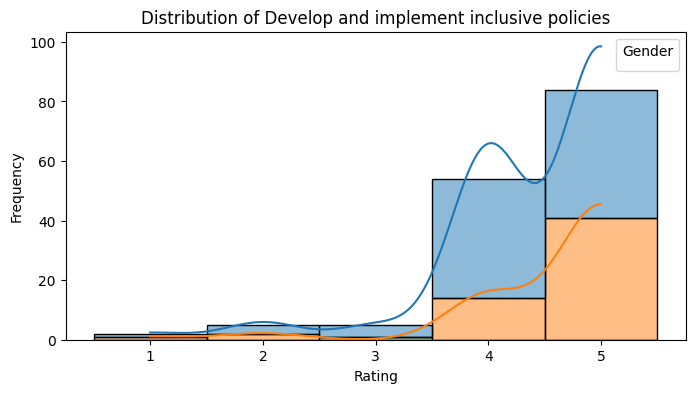

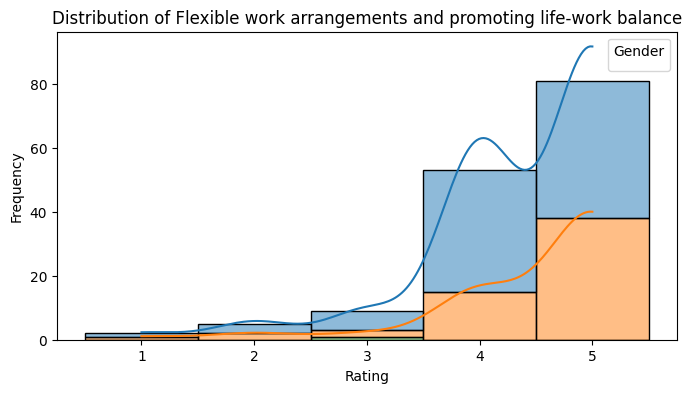

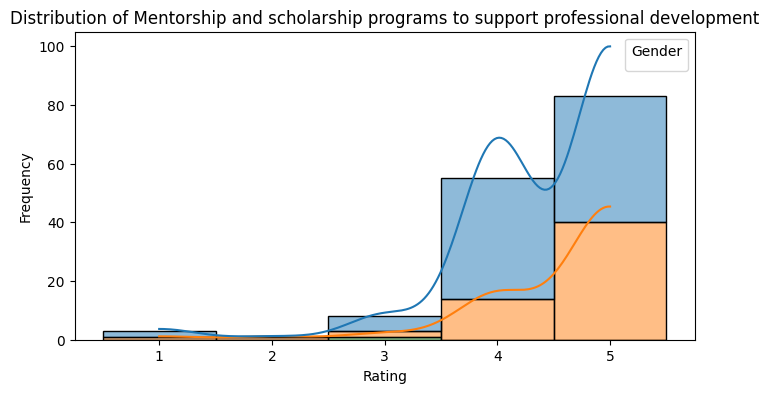

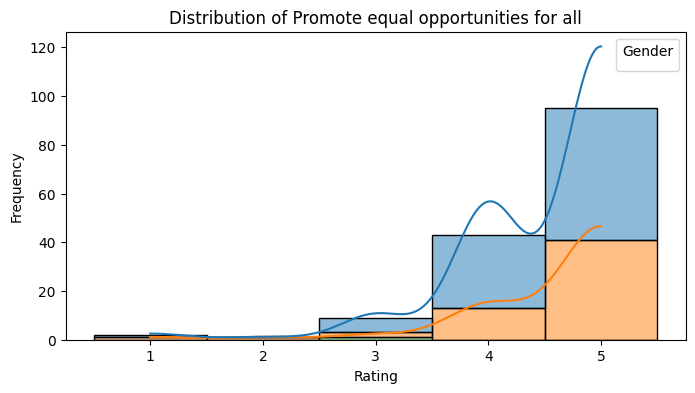

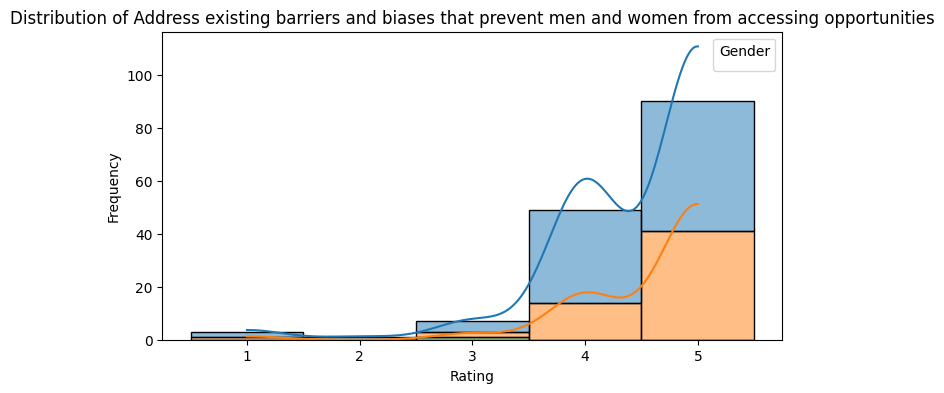

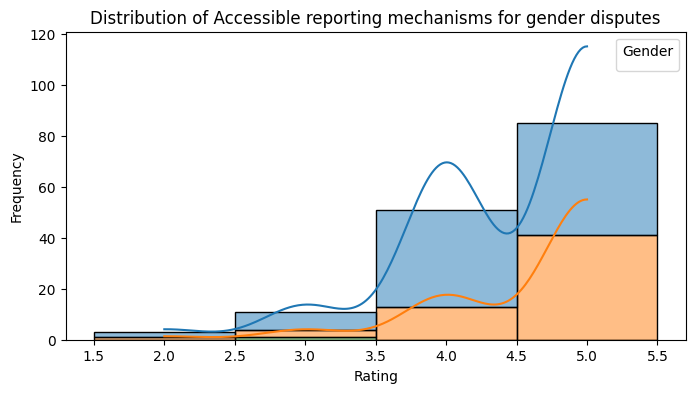

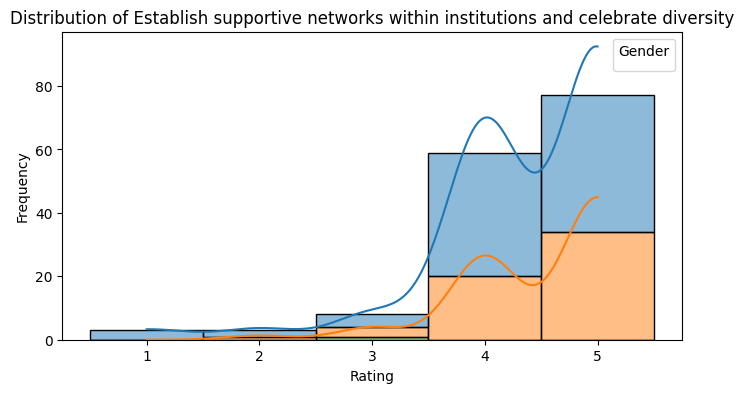

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Distribution of Likert Scale Variables by Gender
for var in specific_columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(data=df, x=var, kde=True, hue='Gender', multiple='stack', discrete=True)
    plt.title(f'Distribution of {var}')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.legend(title='Gender')
    plt.show()


# 5.7. In your opinion, how do you rate these recommendations towards promoting gender inclusivity in your work place?

# These charts under 5.7 look nice

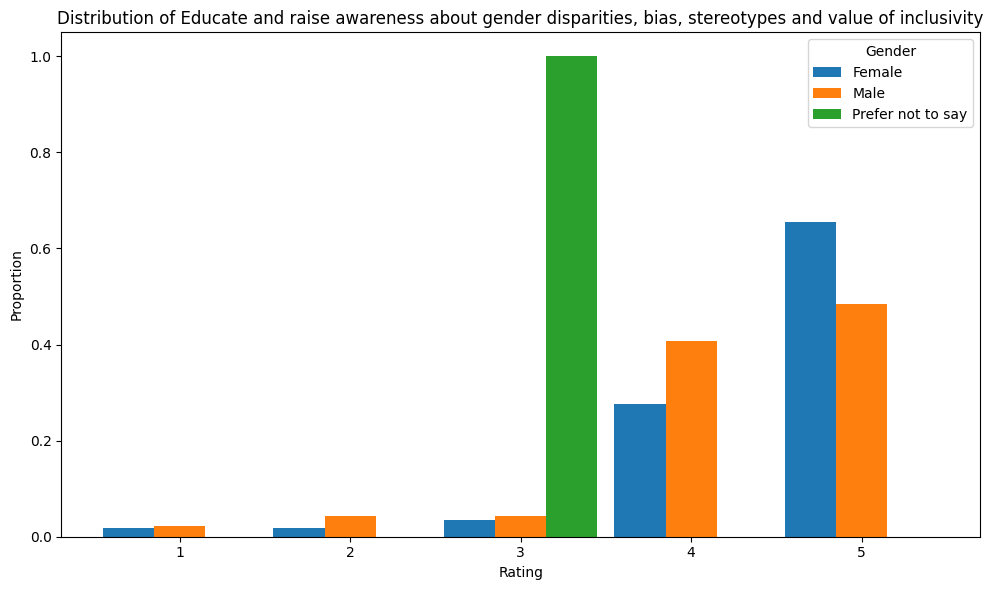

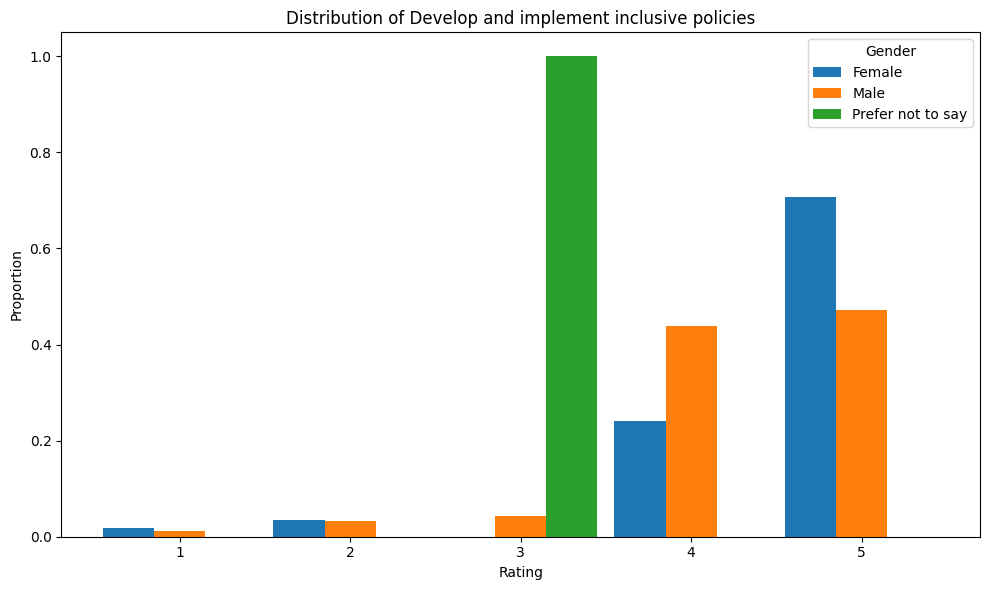

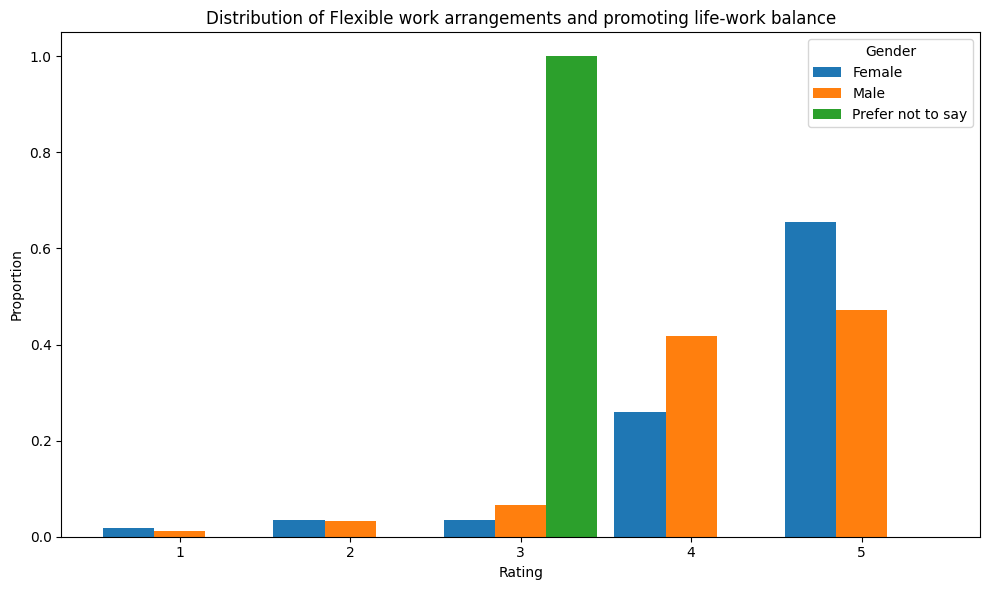

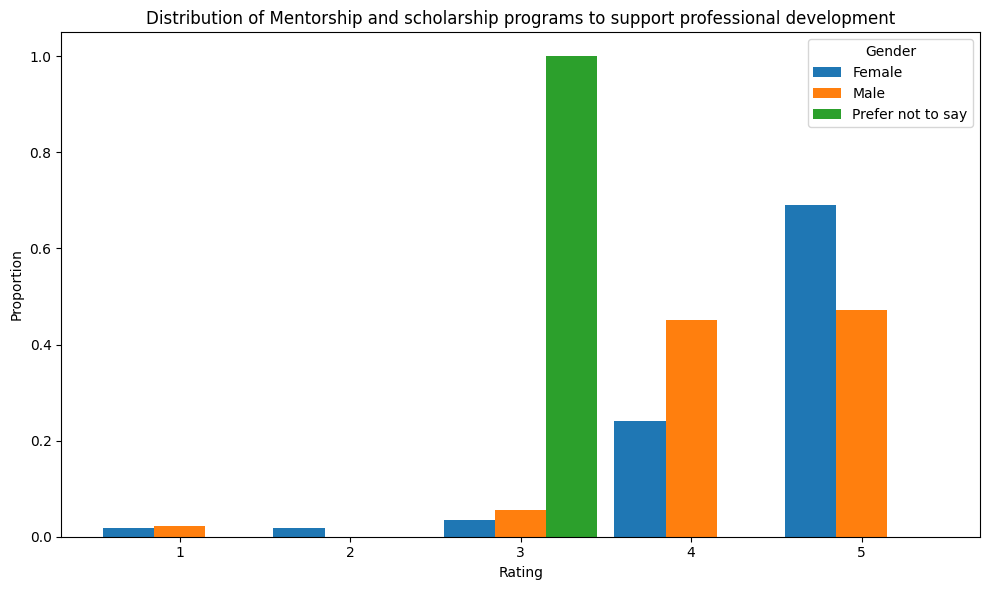

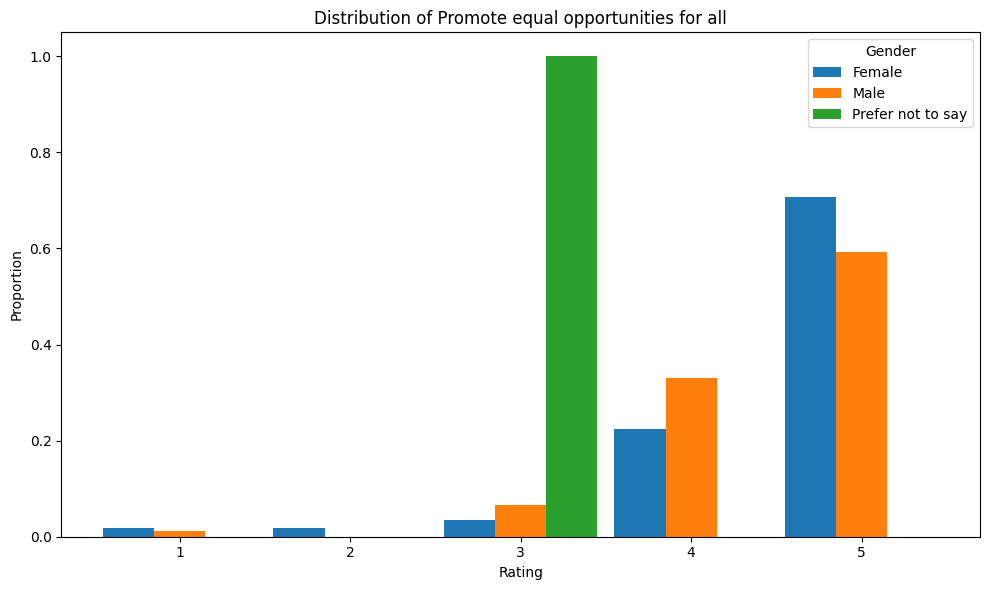

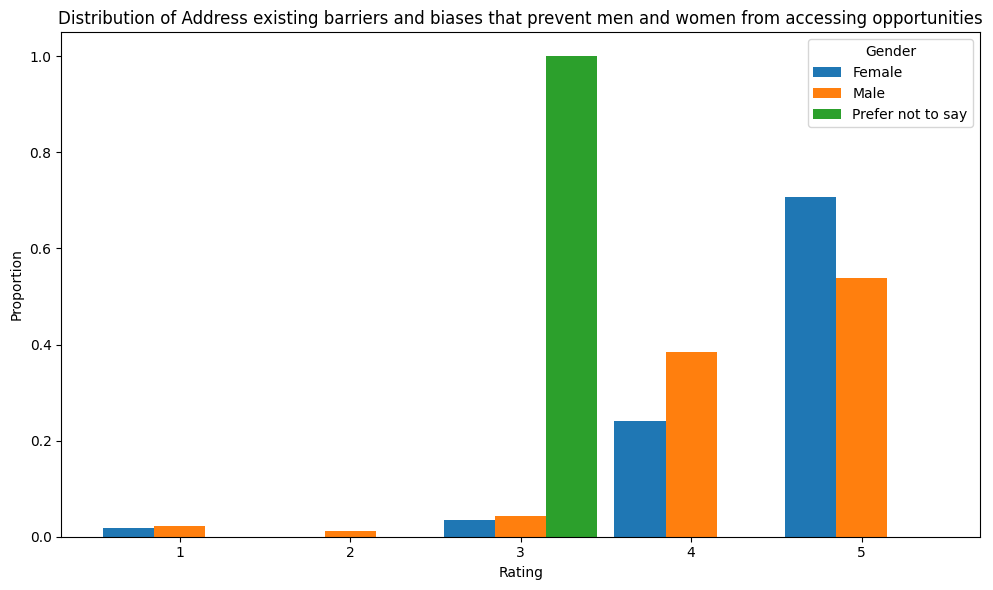

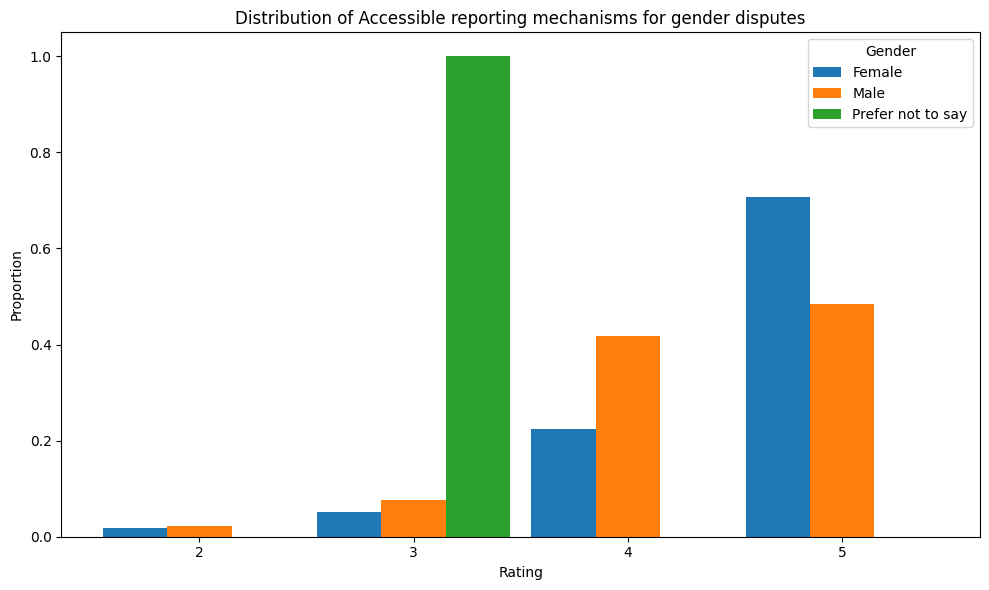

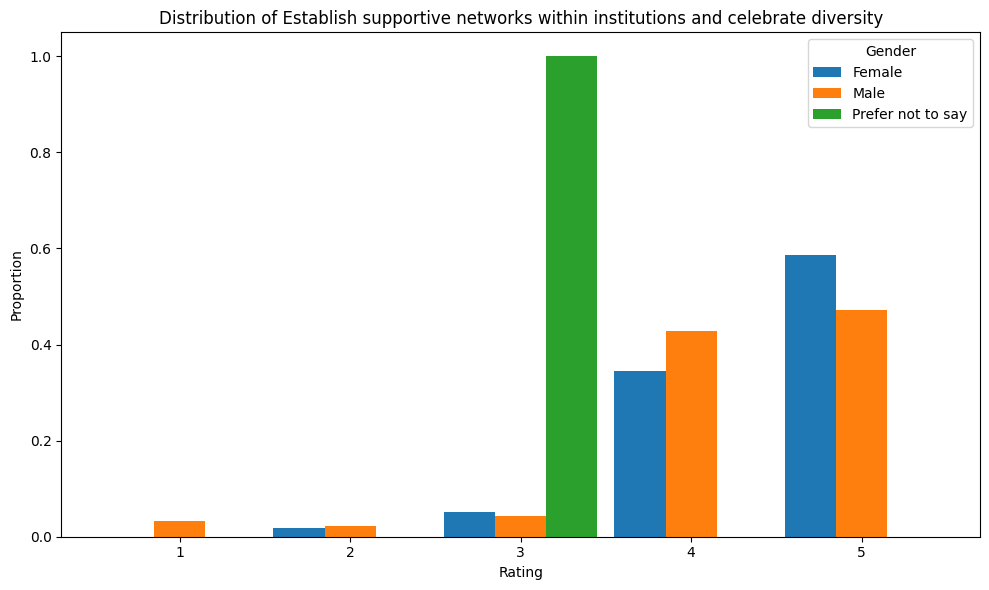

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Create a grouped bar plot for each specific column
for var in specific_columns:
    plt.figure(figsize=(10, 6))
    data = df.groupby('Gender')[var].value_counts(normalize=True).unstack().fillna(0)
    x = np.arange(len(data.columns))
    width = 0.3

    for i, gender in enumerate(data.index):
        plt.bar(x + (i - 1) * width, data.loc[gender], width=width, label=gender)

    plt.xlabel('Rating')
    plt.ylabel('Proportion')
    plt.title(f'Distribution of {var}')
    plt.xticks(x, data.columns)
    plt.legend(title='Gender')
    plt.tight_layout()
    plt.show()


## "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",

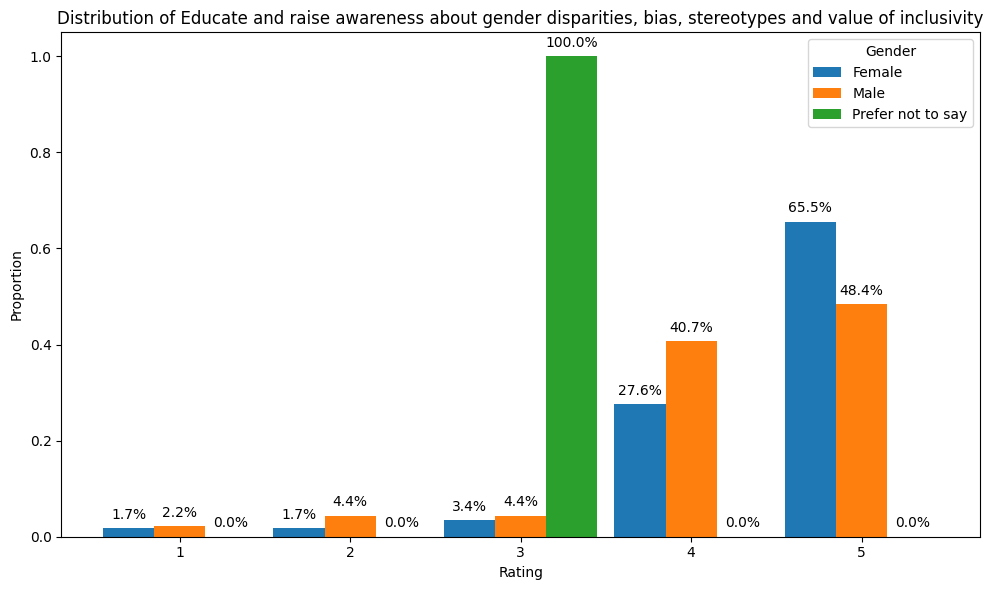

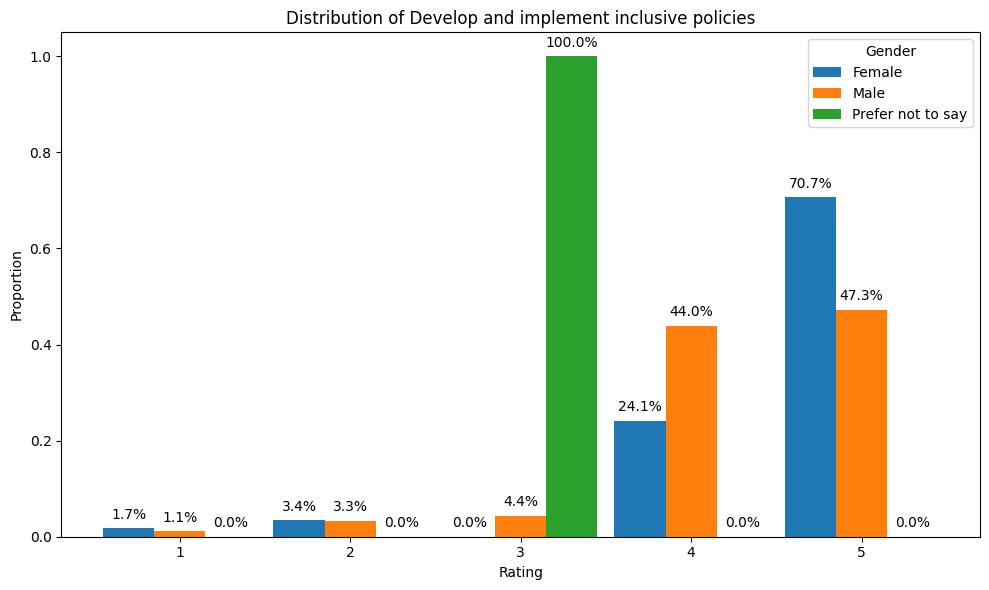

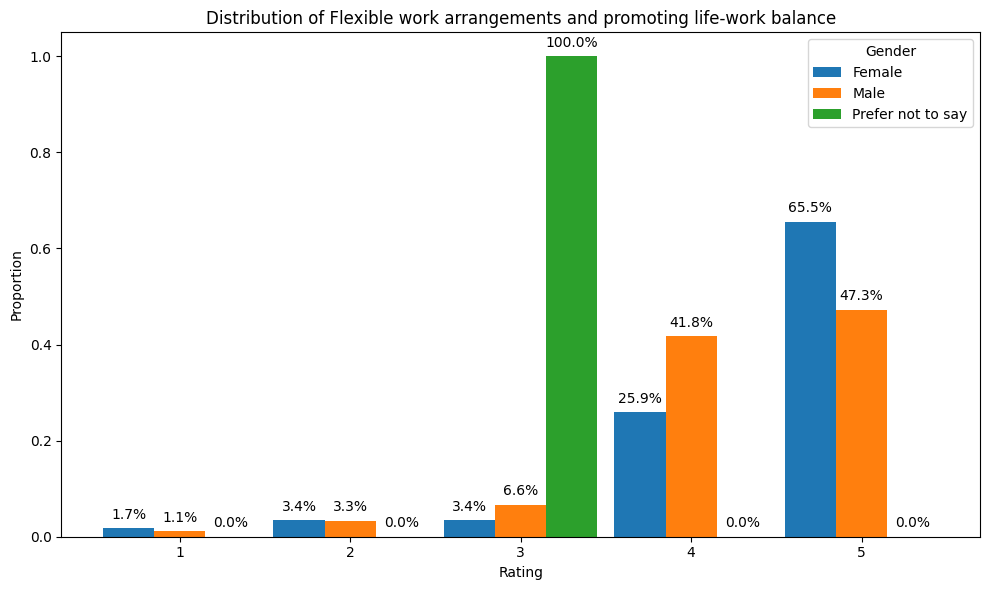

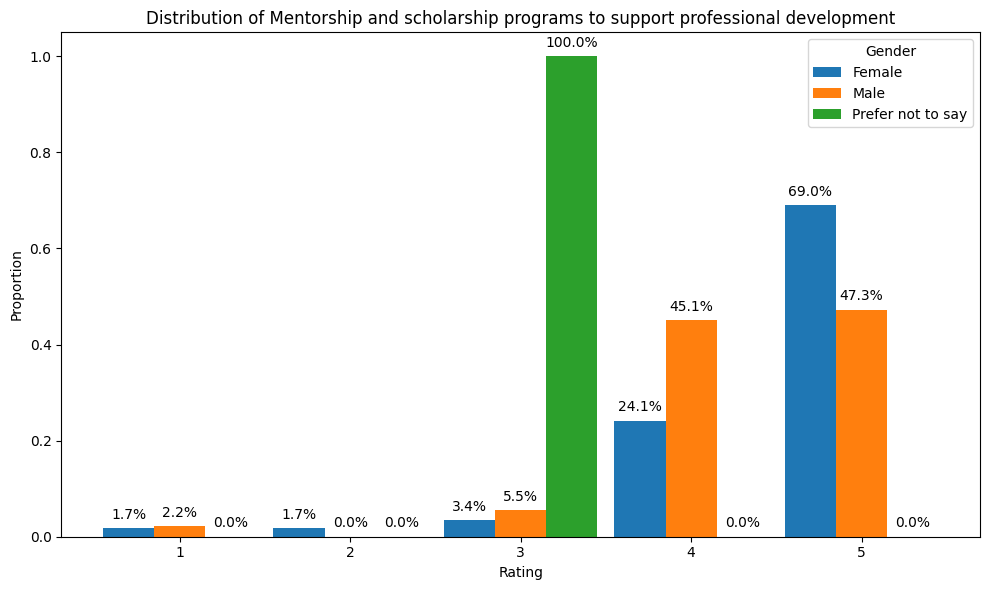

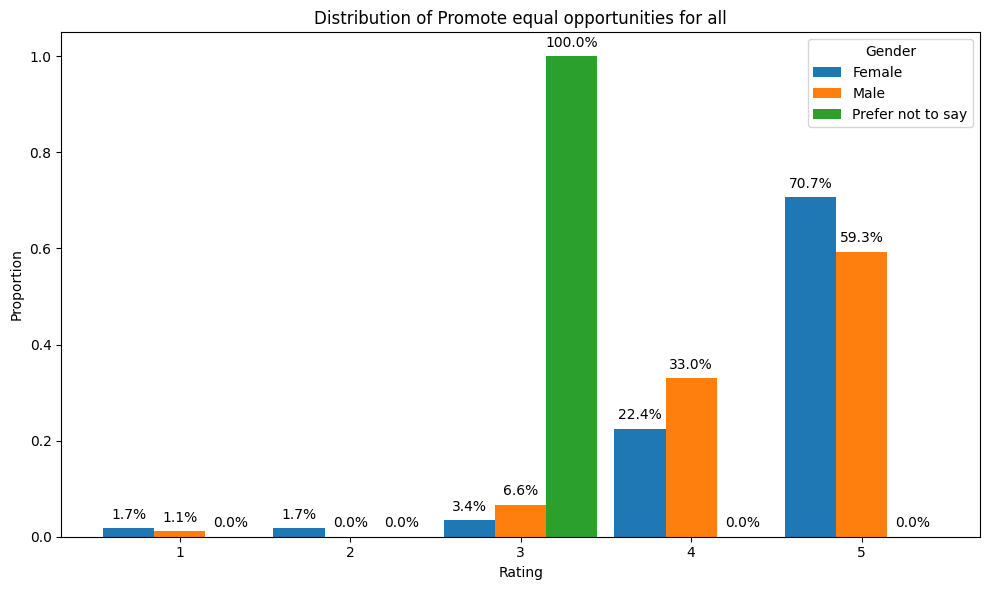

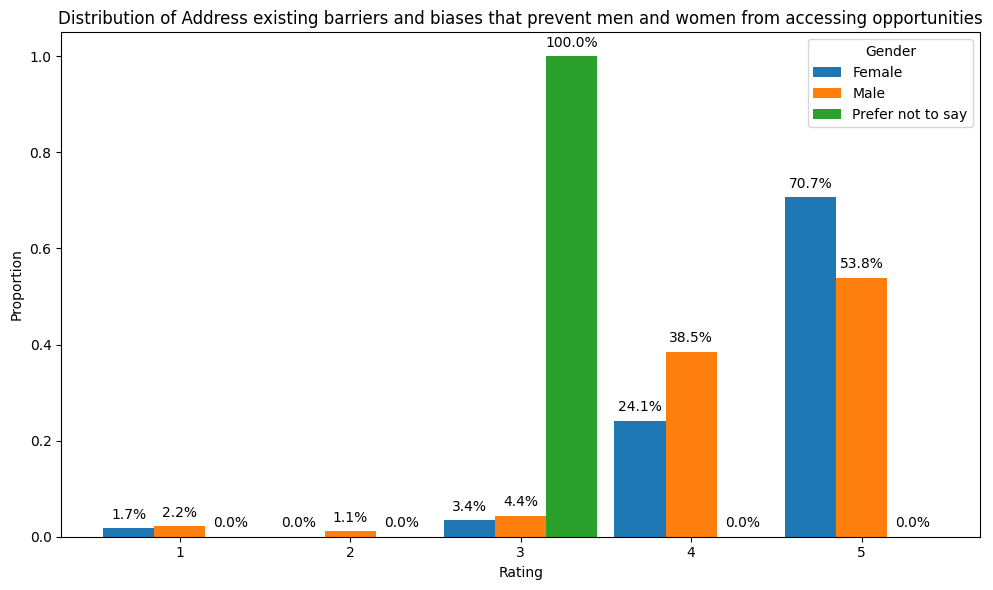

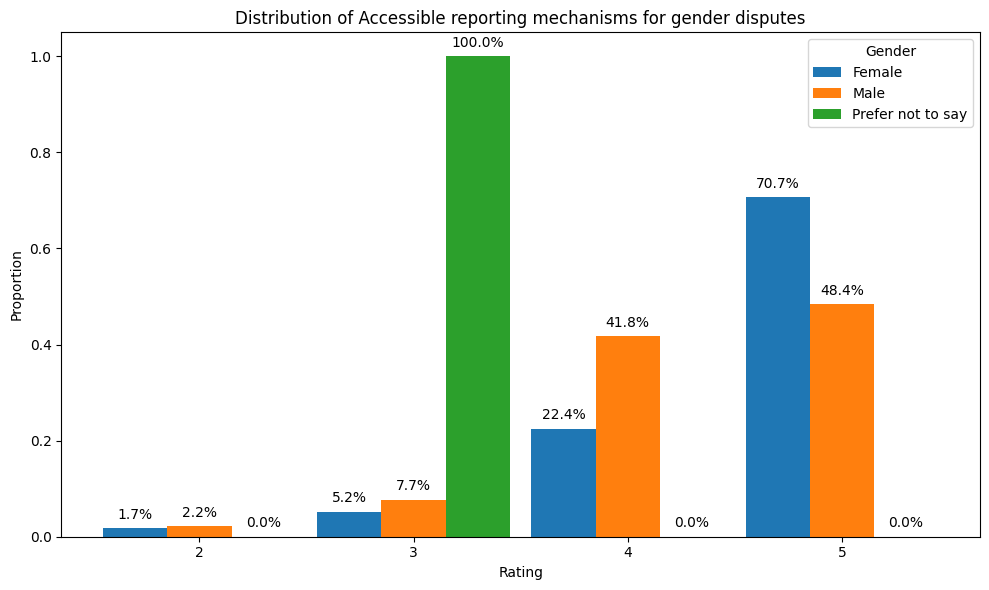

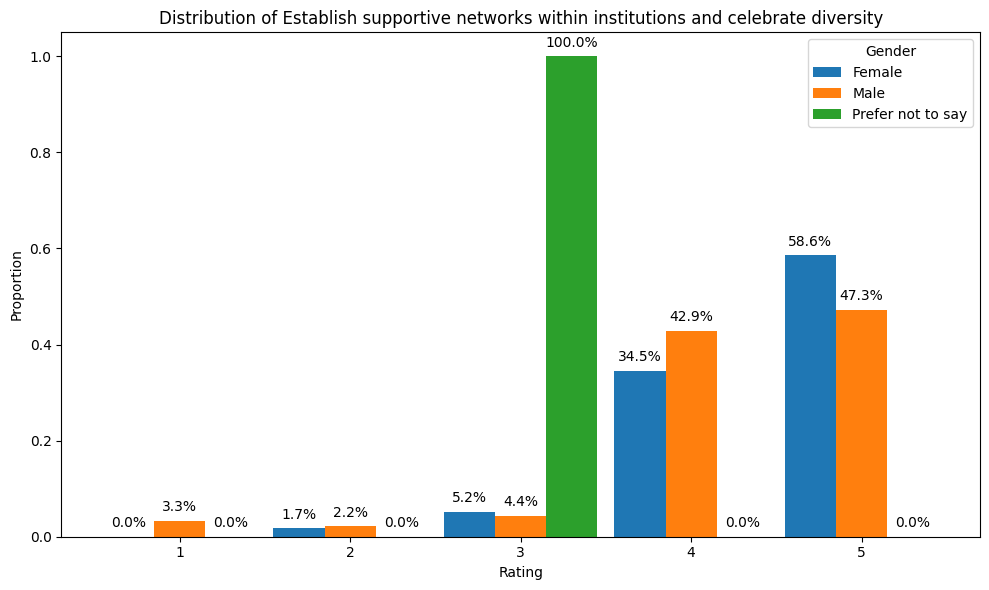

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Create a grouped bar plot for each specific column
for var in specific_columns:
    plt.figure(figsize=(10, 6))
    data = df.groupby('Gender')[var].value_counts(normalize=True).unstack().fillna(0)
    x = np.arange(len(data.columns))
    width = 0.3

    for i, gender in enumerate(data.index):
        plt.bar(x + (i - 1) * width, data.loc[gender], width=width, label=gender)
        for j, val in enumerate(data.loc[gender]):
            plt.text(x[j] + (i - 1) * width, val + 0.02, f'{val:.1%}', ha='center')

    plt.xlabel('Rating')
    plt.ylabel('Proportion')
    plt.title(f'Distribution of {var}')
    plt.xticks(x, data.columns)
    plt.legend(title='Gender')
    plt.tight_layout()
    plt.show()

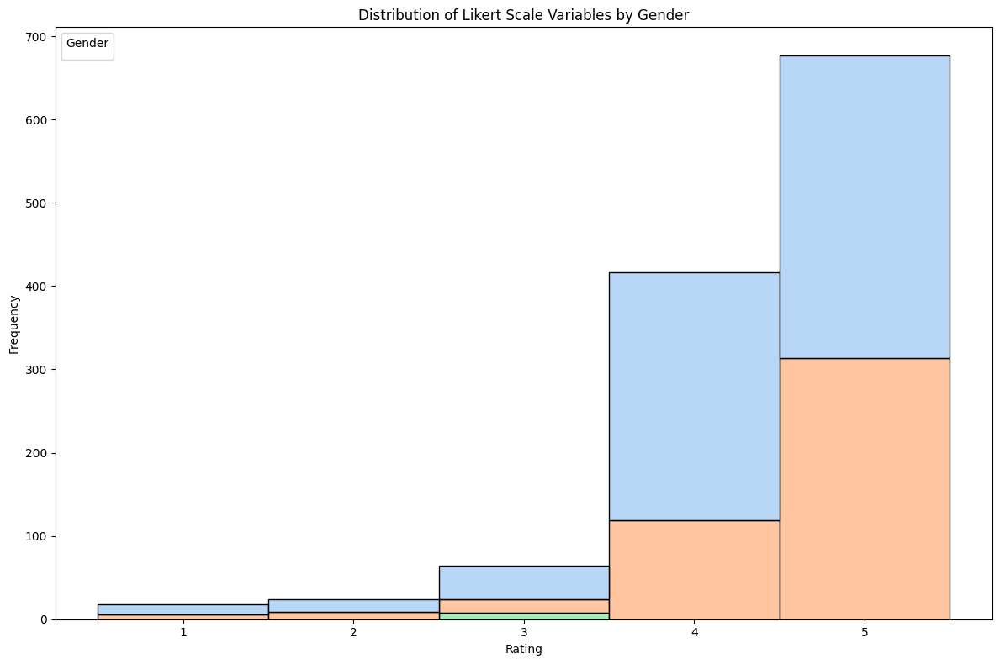

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Melt the DataFrame to reshape it for plotting
melted_df = pd.melt(df, id_vars=['Gender'], value_vars=specific_columns, var_name='Category', value_name='Rating')

# Plotting the stacked bar chart
plt.figure(figsize=(12, 8))
sns.histplot(data=melted_df, x='Rating', hue='Gender', multiple='stack', palette='pastel', discrete=True)
plt.title('Distribution of Likert Scale Variables by Gender')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

### The chart visually represents the distribution of Likert scale ratings across featuers for Rating of recommendations received towards promoting gender inclusivity in the work place, displaying the percentage contributions of male, female, and "Prefer not to say" responses for each feature.

<ipython-input-9-4f7538bbb4f6>:42: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


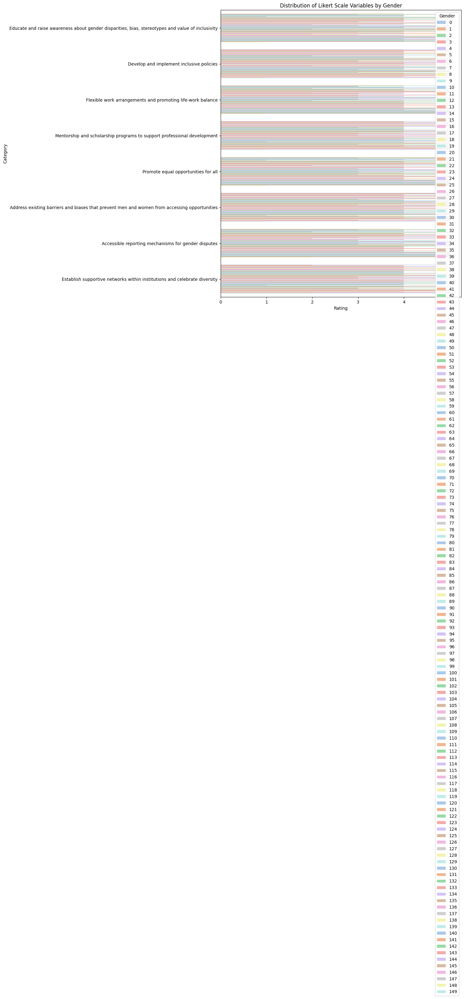

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Transpose the DataFrame
transposed_df = df[specific_columns].transpose()

# Melt the transposed DataFrame to reshape it for plotting
melted_df = pd.melt(transposed_df.reset_index(), id_vars='index', var_name='Gender', value_name='Rating')

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 12))
sns.barplot(data=melted_df, x='Rating', y='index', hue='Gender', palette='pastel')
plt.title('Distribution of Likert Scale Variables by Gender')
plt.xlabel('Rating')
plt.ylabel('Category')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


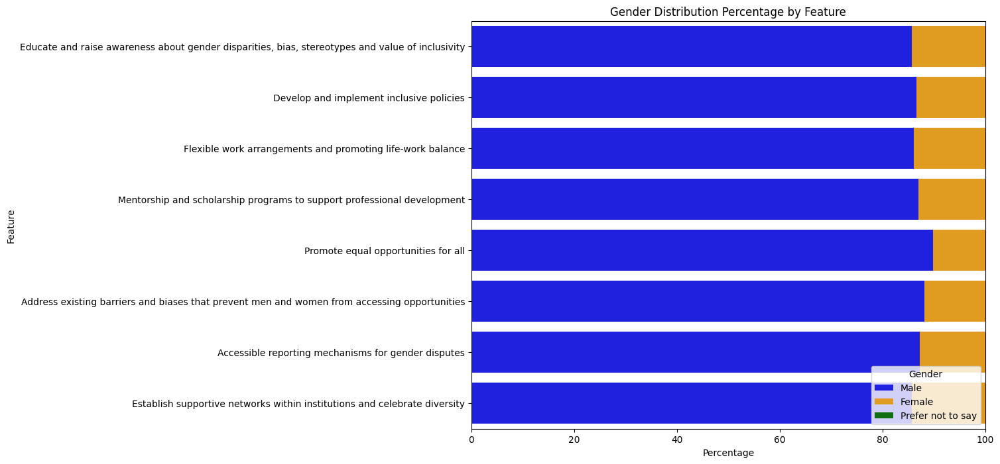

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Initialize empty lists to store percentages for each gender
male_percentages = []
female_percentages = []
prefer_not_to_say_percentages = []

# Iterate over specific columns to calculate the percentages
for col in specific_columns:
    # Calculate percentages for each gender
    male_percentage = (df[df['Gender'] == 'Male'][col].sum() / (5 * len(df[df['Gender'] == 'Male'])) * 100)
    female_percentage = (df[df['Gender'] == 'Female'][col].sum() / (5 * len(df[df['Gender'] == 'Female'])) * 100)
    prefer_not_to_say_percentage = (df[df['Gender'] == 'Prefer not to say'][col].sum() / (5 * len(df[df['Gender'] == 'Prefer not to say'])) * 100)

    # Append percentages to respective lists
    male_percentages.append(male_percentage)
    female_percentages.append(female_percentage)
    prefer_not_to_say_percentages.append(prefer_not_to_say_percentage)

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Category': specific_columns,
    'Male': male_percentages,
    'Female': female_percentages,
    'Prefer not to say': prefer_not_to_say_percentages
})

# Plotting the horizontal bar chart with percentages
plt.figure(figsize=(10, 8))
sns.barplot(data=data, y='Category', x='Male', color='blue', label='Male')
sns.barplot(data=data, y='Category', x='Female', color='orange', label='Female', left=data['Male'])
sns.barplot(data=data, y='Category', x='Prefer not to say', color='green', label='Prefer not to say', left=data['Male'] + data['Female'])

plt.title('Gender Distribution Percentage by Feature')
plt.xlabel('Percentage')
plt.ylabel('Feature')
plt.xlim(0, 100)
plt.legend(title='Gender', loc='lower right')

plt.show()


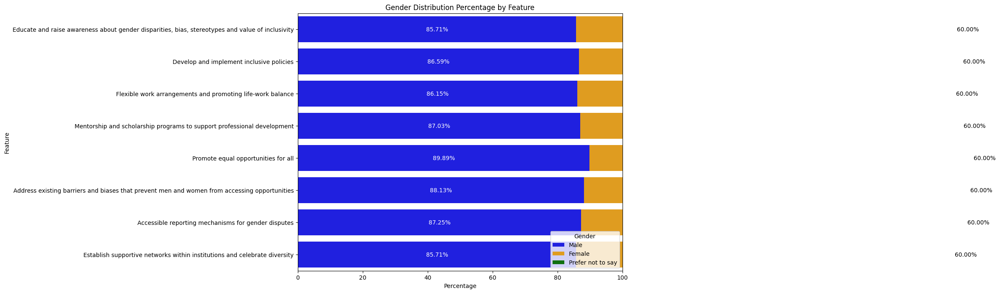

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Initialize empty lists to store percentages for each gender
male_percentages = []
female_percentages = []
prefer_not_to_say_percentages = []

# Iterate over specific columns to calculate the percentages
for col in specific_columns:
    # Calculate percentages for each gender
    male_percentage = (df[df['Gender'] == 'Male'][col].sum() / (5 * len(df[df['Gender'] == 'Male'])) * 100)
    female_percentage = (df[df['Gender'] == 'Female'][col].sum() / (5 * len(df[df['Gender'] == 'Female'])) * 100)
    prefer_not_to_say_percentage = (df[df['Gender'] == 'Prefer not to say'][col].sum() / (5 * len(df[df['Gender'] == 'Prefer not to say'])) * 100)

    # Append percentages to respective lists
    male_percentages.append(male_percentage)
    female_percentages.append(female_percentage)
    prefer_not_to_say_percentages.append(prefer_not_to_say_percentage)

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Category': specific_columns,
    'Male': male_percentages,
    'Female': female_percentages,
    'Prefer not to say': prefer_not_to_say_percentages
})

# Plotting the horizontal bar chart with percentages
plt.figure(figsize=(10, 8))
sns.barplot(data=data, y='Category', x='Male', color='blue', label='Male')
sns.barplot(data=data, y='Category', x='Female', color='orange', label='Female', left=data['Male'])
sns.barplot(data=data, y='Category', x='Prefer not to say', color='green', label='Prefer not to say', left=data['Male'] + data['Female'])

# Add percentages on bars
for index, row in data.iterrows():
    plt.text(row['Male'] / 2, index, f'{row["Male"]:.2f}%', color='white', va='center', ha='center')
    plt.text(row['Male'] + row['Female'] / 2, index, f'{row["Female"]:.2f}%', color='white', va='center', ha='center')
    plt.text(row['Male'] + row['Female'] + row['Prefer not to say'] / 2, index, f'{row["Prefer not to say"]:.2f}%', color='black', va='center', ha='center')

plt.title('Gender Distribution Percentage by Feature')
plt.xlabel('Percentage')
plt.ylabel('Feature')
plt.xlim(0,100)
plt.legend(title='Gender', loc='lower right')

plt.show()

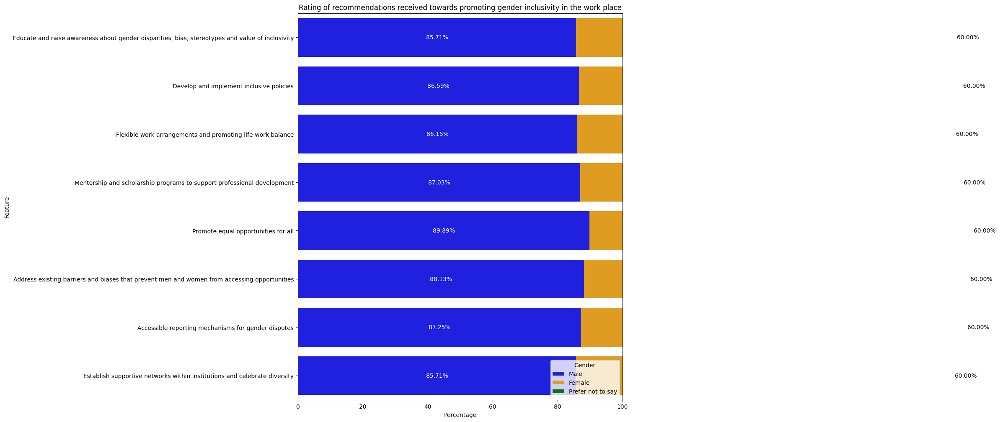

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the DataFrame from Excel file
df = pd.read_excel('gnd.xlsx')

# Mapping gender values to their respective categories
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
df['Gender'] = df['Gender'].map(gender_mapping)

# Specify the columns you want to analyze
specific_columns = [
    "Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",
    "Develop and implement inclusive policies",
    "Flexible work arrangements and promoting life-work balance",
    "Mentorship and scholarship programs to support professional development",
    "Promote equal opportunities for all",
    "Address existing barriers and biases that prevent men and women from accessing opportunities",
    "Accessible reporting mechanisms for gender disputes",
    "Establish supportive networks within institutions and celebrate diversity",
    "Regularly collect sex disaggregated data, evaluate effectiveness of gender initiatives and adjust"
]

# Correcting the column name if there was a typo
specific_columns = [col for col in specific_columns if col in df.columns]

# Initialize empty lists to store percentages for each gender
male_percentages = []
female_percentages = []
prefer_not_to_say_percentages = []

# Iterate over specific columns to calculate the percentages
for col in specific_columns:
    # Calculate percentages for each gender
    # Summing up Likert scale ratings for each gender and normalizing by the total number of responses
    male_percentage = (df[df['Gender'] == 'Male'][col].sum() / (5 * len(df[df['Gender'] == 'Male'])) * 100)
    female_percentage = (df[df['Gender'] == 'Female'][col].sum() / (5 * len(df[df['Gender'] == 'Female'])) * 100)
    prefer_not_to_say_percentage = (df[df['Gender'] == 'Prefer not to say'][col].sum() / (5 * len(df[df['Gender'] == 'Prefer not to say'])) * 100)

    # Append percentages to respective lists
    male_percentages.append(male_percentage)
    female_percentages.append(female_percentage)
    prefer_not_to_say_percentages.append(prefer_not_to_say_percentage)

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Category': specific_columns,
    'Male': male_percentages,
    'Female': female_percentages,
    'Prefer not to say': prefer_not_to_say_percentages
})

# Plotting the horizontal bar chart with percentages
plt.figure(figsize=(10, 12))

# Plotting bars for male percentages
sns.barplot(data=data, y='Category', x='Male', color='blue', label='Male')

# Plotting bars for female percentages
sns.barplot(data=data, y='Category', x='Female', color='orange', label='Female', left=data['Male'])

# Plotting bars for 'Prefer not to say' percentages
sns.barplot(data=data, y='Category', x='Prefer not to say', color='green', label='Prefer not to say', left=data['Male'] + data['Female'])

# Add percentages on bars
for index, row in data.iterrows():
    # Add male percentage
    plt.text(row['Male'] / 2, index, f'{row["Male"]:.2f}%', color='white', va='center', ha='center')

    # Add female percentage
    plt.text(row['Male'] + row['Female'] / 2, index, f'{row["Female"]:.2f}%', color='white', va='center', ha='center')

    # Add 'Prefer not to say' percentage
    plt.text(row['Male'] + row['Female'] + row['Prefer not to say'] / 2, index, f'{row["Prefer not to say"]:.2f}%', color='black', va='center', ha='center')

# Set title, labels, and legend
plt.title('Rating of recommendations received towards promoting gender inclusivity in the work place')
plt.xlabel('Percentage')
plt.ylabel('Feature')
plt.xlim(0, 100)
plt.legend(title='Gender', loc='lower right')

plt.show()



The chart visually represents the distribution of Likert scale ratings across featuers for Rating of recommendations received towards promoting gender inclusivity in the work place, displaying the percentage contributions of male, female, and "Prefer not to say" responses for each feature.

## Distribution of numerical variables
### Creating likert chart for the responses

In [ ]:
#Loading the dataset
from google.colab import files
uploaded = files.upload()

Saving gnd.xlsx to gnd.xlsx


# Distribution of numerical variables and categorical variables


## this code takes long to run

Missing Values:
Country of origin                                                                                      0
country of work                                                                                        0
institution_type                                                                                       0
Name_Institution                                                                                       0
age                                                                                                    0
                                                                                                    ... 
Address existing barriers and biases that prevent men and women from accessing opportunities           0
Accessible reporting mechanisms for gender disputes                                                    0
Establish supportive networks within institutions and celebrate diversity                              0
Regularly collect sex disagregated data

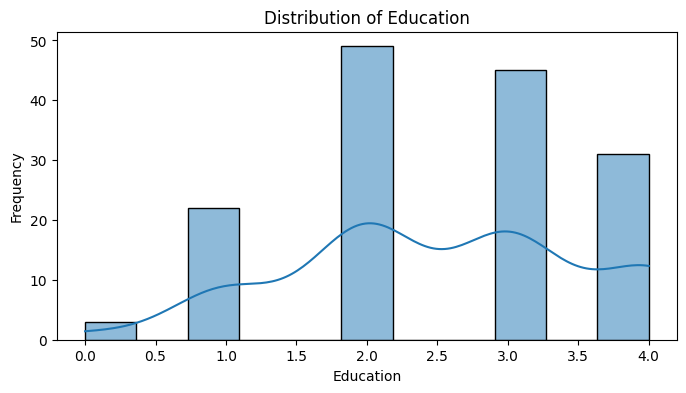

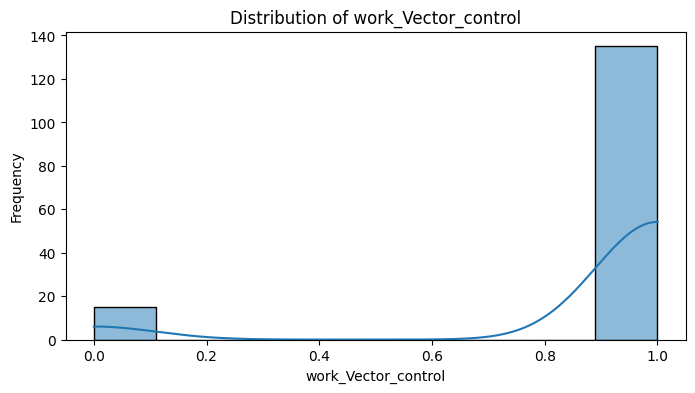

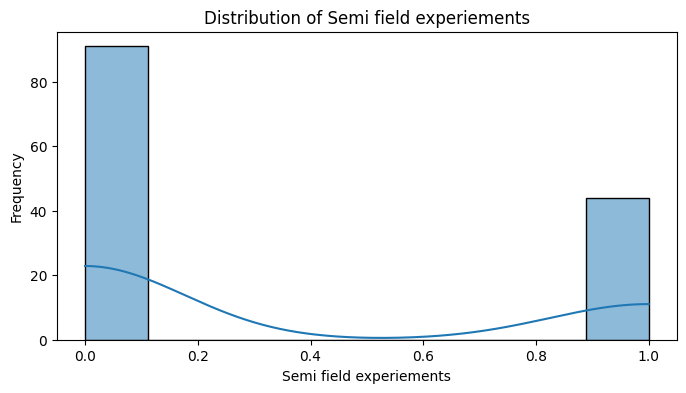

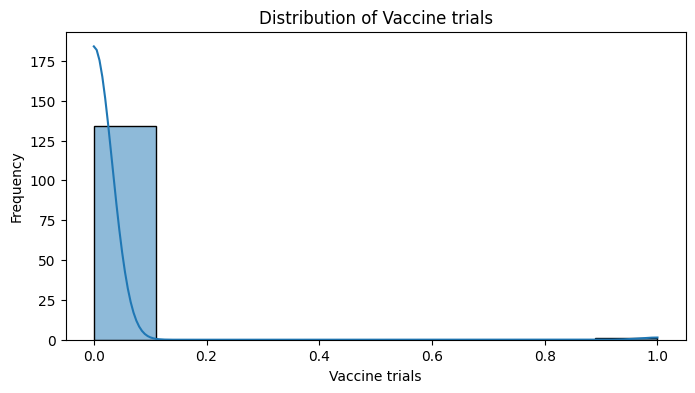

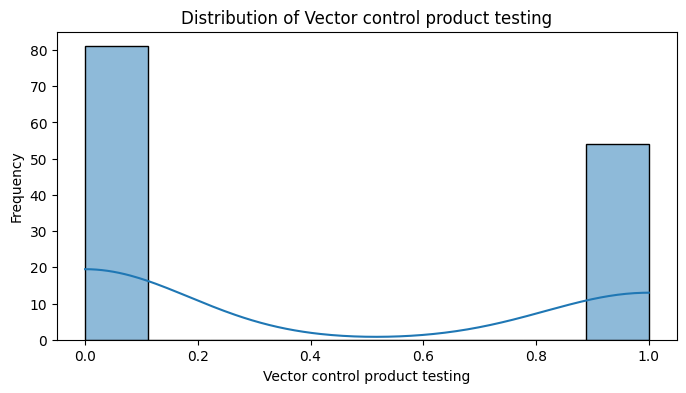

...

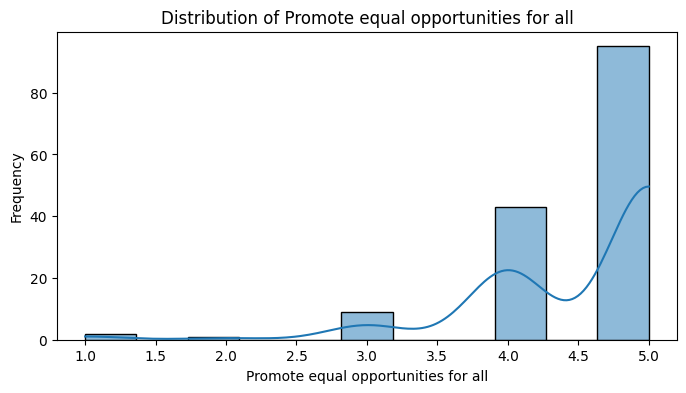

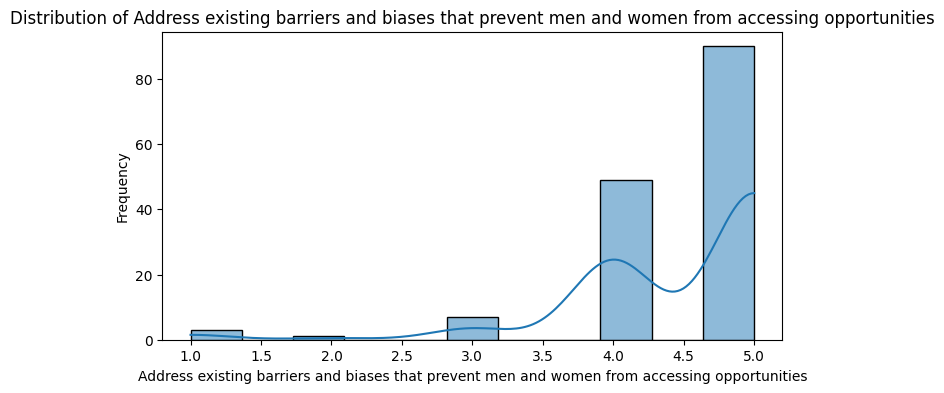

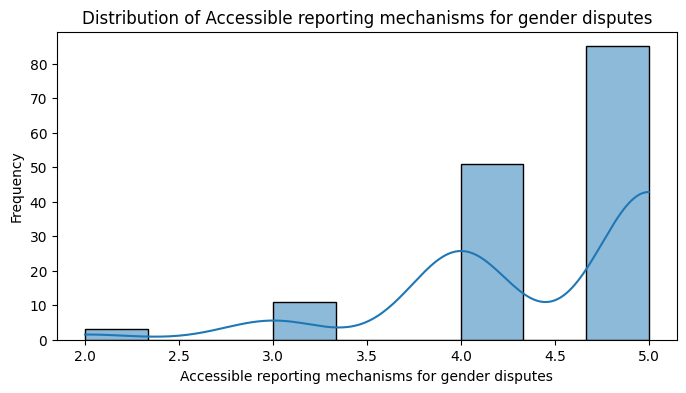

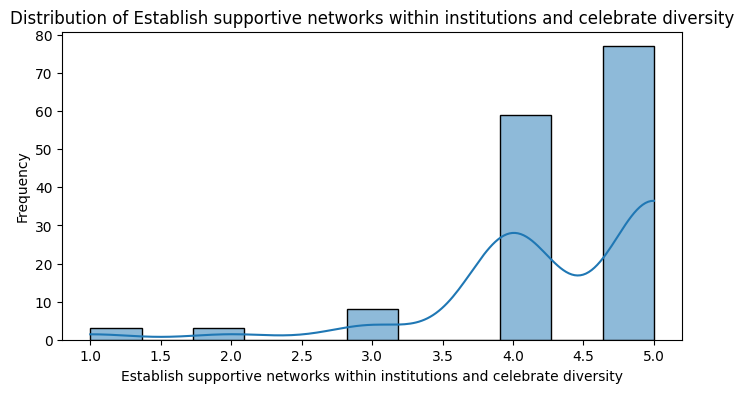

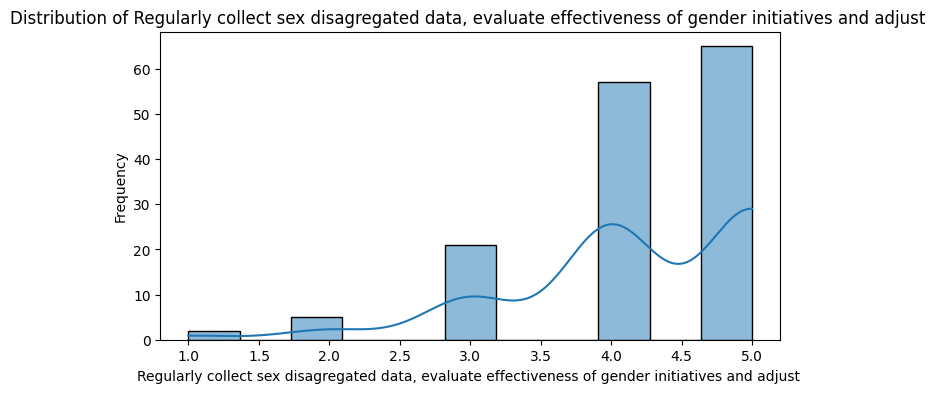

In [ ]:
df = pd.read_excel('gnd.xlsx')

# Step 2: Check for missing values
missing_values = df.isnull().sum()
print("Missing Values:")
print(missing_values)

# Step 3: Check for duplicates
duplicates = df.duplicated().sum()
print("Number of duplicates:", duplicates)

# Remove duplicates
data = df.drop_duplicates()

# Step 4: Explore the data
# Summary statistics
summary_stats = df.describe()
print("\nSummary Statistics:")
print(summary_stats)

# Distribution of numerical variables
numerical_vars = df.select_dtypes(include='number').columns.tolist()
for var in numerical_vars:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[var], kde=True)
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.show()

# Relationships between variables (scatter plots)
sns.pairplot(df, diag_kind='kde')
plt.show()

# Step 5: Visualize the data
# Example: Bar plot of categorical variables
categorical_vars = df.select_dtypes(include='object').columns.tolist()
for var in categorical_vars:
    plt.figure(figsize=(8, 4))
    sns.countplot(df[var])
    plt.title(f'Count of {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()


# Gender distribution by education level, years of experience

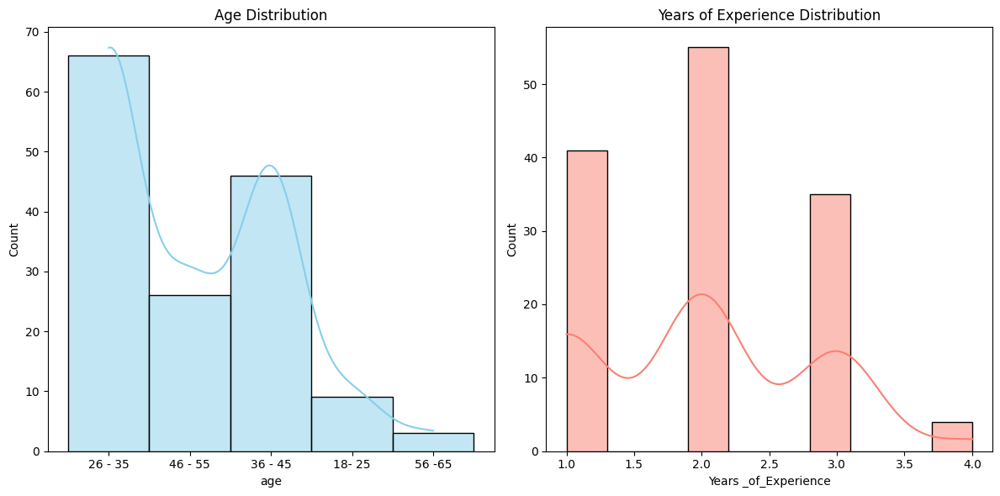

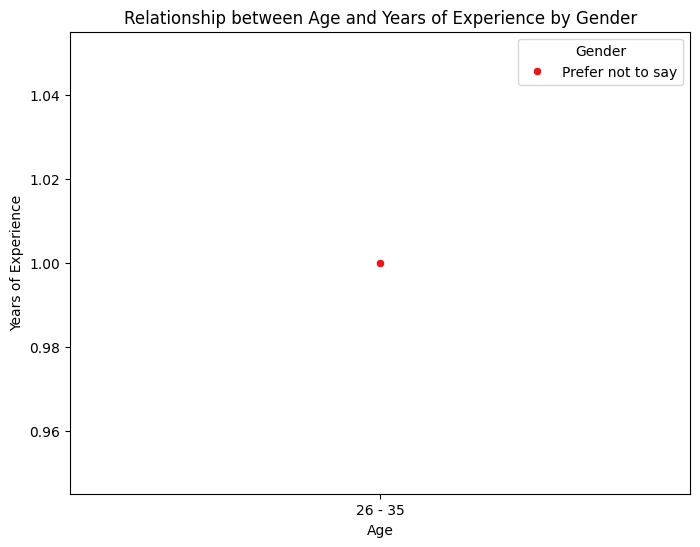

ValueError: Could not interpret value `Years of Experience` for `y`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

In [ ]:
# Mapping for Gender and Education columns
gender_mapping = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
education_mapping = {4: 'PhD', 3: 'MSc', 2: 'BSc', 1: 'Diploma', 0: 'College'}

# Apply mapping to Gender and Education columns
df['Gender'] = df['Gender'].map(gender_mapping)
df['Education'] = df['Education'].map(education_mapping)

# Summary statistics
summary_stats = df[['age', 'Years _of_Experience']].describe()

# Visualizations
plt.figure(figsize=(12, 6))

# Age distribution
plt.subplot(1, 2, 1)
sns.histplot(df['age'], bins=10, kde=True, color='skyblue')
plt.title('Age Distribution')

# Years of Experience distribution
plt.subplot(1, 2, 2)
sns.histplot(df['Years _of_Experience'], bins=10, kde=True, color='salmon')
plt.title('Years of Experience Distribution')

plt.tight_layout()
plt.show()

# Relationship between Age and Years of Experience
plt.figure(figsize=(8, 6))
sns.scatterplot(x='age', y='Years _of_Experience', data=df, hue='Gender', palette='Set1')
plt.title('Relationship between Age and Years of Experience by Gender')
plt.xlabel('Age')
plt.ylabel('Years of Experience')
plt.legend(title='Gender')
plt.show()

# Relationship between Education and Years of Experience
plt.figure(figsize=(10, 6))
sns.boxplot(x='Education', y='Years of Experience', data=df, palette='Set2')
plt.title('Relationship between Education and Years of Experience')
plt.xlabel('Education Level')
plt.ylabel('Years of Experience')
plt.show()


# Check for null values

In [ ]:
# Check for null values
null_values = df.isnull()

# Count the number of null values in each column
null_counts = null_values.sum()

# Display the null counts
print("Null value counts per column:")
print(null_counts)

Null value counts per column:
Country of origin                                                                                      0
country of work                                                                                        0
institution_type                                                                                       0
Name_Institution                                                                                       0
age                                                                                                    0
                                                                                                    ... 
Address existing barriers and biases that prevent men and women from accessing opportunities           0
Accessible reporting mechanisms for gender disputes                                                    0
Establish supportive networks within institutions and celebrate diversity                              0
Regularly collect sex dis

In [ ]:
# Drop rows with any null values. Dropping null values only in specific columns
New_df = df.drop(columns=['5.8. If there are other options you would like to suggest, please list them here'])
New_df.shape

(150, 298)

# The codes below are for the very first draft that I sent

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
#Check the first few rows of the dataset
print(New_df.head())

  Country of origin country of work                         institution_type  \
0        Cabo Verde      Cabo Verde                     Research Institution   
1            Uganda          Uganda       Government Agency/local government   
2            Uganda          Uganda  National Malaria Control Program (NMCP)   
3           Nigeria         Nigeria                     Research Institution   
4           Nigeria         Nigeria                     Research Institution   

                                    Name_Institution      age Gender  \
0                National Institute of Public Health  26 - 35      1   
1                                      Kazo District  26 - 35      1   
2       National Malaria Control Division-MOH Uganda  46 - 55      1   
3             Nigerian Institute of Medical Research  36 - 45      1   
4  Nigerian Institute of Medical Research Yaba, L...  36 - 45      1   

      marital_status  Education  work_Vector_control  \
0  Currently married          

In [ ]:
#Get a summary of numerical columns to understand their distribution, central tendency, and spread.
print(New_df.describe())

        Education  work_Vector_control  Semi field experiements  \
count  135.000000                135.0               135.000000   
mean     2.562963                  1.0                 0.325926   
std      1.055246                  0.0                 0.470465   
min      0.000000                  1.0                 0.000000   
25%      2.000000                  1.0                 0.000000   
50%      3.000000                  1.0                 0.000000   
75%      3.000000                  1.0                 1.000000   
max      4.000000                  1.0                 1.000000   

       Vaccine trials  Vector control product testing  Field surveys  \
count      135.000000                      135.000000     135.000000   
mean         0.007407                        0.400000       0.466667   
std          0.086066                        0.491723       0.500746   
min          0.000000                        0.000000       0.000000   
25%          0.000000               

In [ ]:
#Check for missing values:
print(New_df.isnull().sum())

Country of origin                                                                                    0
country of work                                                                                      0
institution_type                                                                                     0
Name_Institution                                                                                     0
age                                                                                                  0
                                                                                                    ..
Promote equal opportunities for all                                                                  0
Address existing barriers and biases that prevent men and women from accessing opportunities         0
Accessible reporting mechanisms for gender disputes                                                  0
Establish supportive networks within institutions and celebrate diversity

In [ ]:
#Check data types
print(New_df.dtypes)

Country of origin                                                                                    object
country of work                                                                                      object
institution_type                                                                                     object
Name_Institution                                                                                     object
age                                                                                                  object
                                                                                                      ...  
Promote equal opportunities for all                                                                   int64
Address existing barriers and biases that prevent men and women from accessing opportunities          int64
Accessible reporting mechanisms for gender disputes                                                   int64
Establish supportive network

In [ ]:
#Unique values: Check unique values in categorical columns.
for col in New_df.select_dtypes(include='object').columns:
    print(col, ":", New_df[col].unique())

Country of origin : ['Cabo Verde' 'Uganda' 'Nigeria' "Côte d'Ivoire" 'Tanzania' 'Kenya'
 'Ghana' 'Gambia' 'Senegal' 'Cameroon' 'Malawi' 'Namibia' 'Ethiopia'
 'Sudan' 'The Netherlands']
country of work : ['Cabo Verde' 'Uganda' 'Nigeria' "Côte d'Ivoire" 'Tanzania' 'Kenya'
 'Ghana' 'Gambia' 'Senegal' 'Cameroon' 'Malawi' 'Namibia' 'Ethiopia'
 'Somalia' 'Sudan']
institution_type : ['Research Institution' 'Government Agency/local government'
 'National Malaria Control Program (NMCP)'
 'International organization/agency' 'Non Governmental Organization (NGO)'
 'Academic Institution' 'Health center' 'Ministry of health']
Name_Institution : ['National Institute of Public Health' 'Kazo District'
 'National Malaria Control Division-MOH Uganda'
 'Nigerian Institute of Medical Research'
 'Nigerian Institute of Medical Research Yaba, Lagos'
 "Centre Suisse de Recherches Scientifiques en Côte d'Ivoire"
 'Kaliro_District local government' 'RTI International'
 'Buliisa District Local Government' 'Ifakar

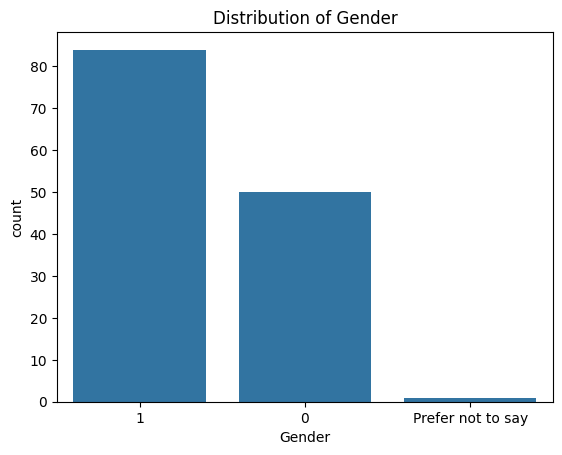

In [ ]:
#Distribution of categorical variables: Plot histograms or count plots to visualize the distribution of categorical variables.
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x='Gender', data=New_df)
plt.title('Distribution of Gender')
plt.show()

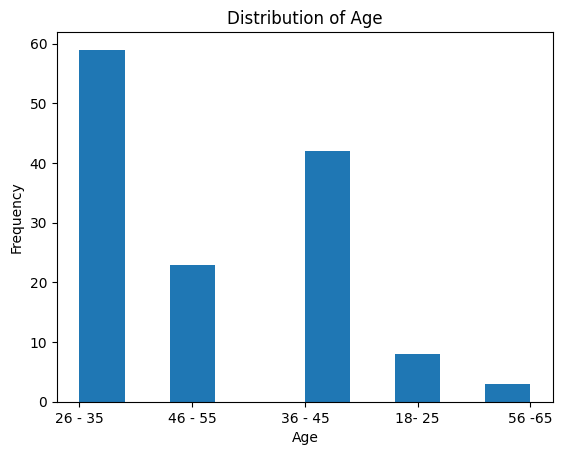

In [ ]:
#Distribution of numerical variables: Plot histograms to visualize the distribution of numerical variables.
plt.hist(New_df['age'], bins=10)
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

<ipython-input-113-47647c13609b>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = New_df.corr()


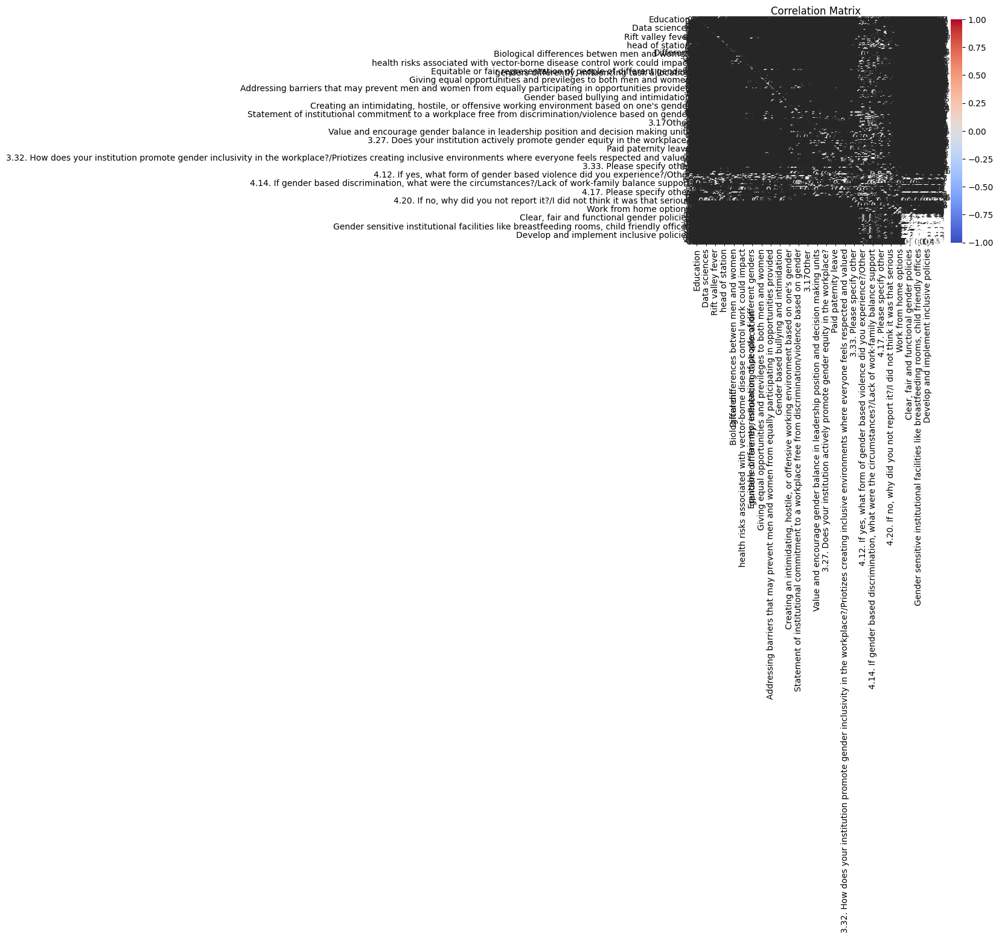

In [ ]:
#Correlation analysis: Check the correlation between numerical variables.
correlation_matrix = New_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

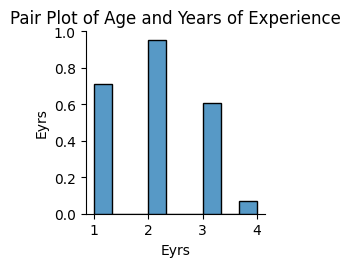

In [ ]:
#Explore relationships between variables: Plot scatter plots or pair plots to visualize relationships between numerical variables.
sns.pairplot(New_df[['age', 'Eyrs']])
plt.title('Pair Plot of Age and Years of Experience')
plt.show()

In [ ]:
# Describe columns from column 1 to column 10
decription_10_columns = New_df.iloc[0:10].describe()
# Display the description
print(decription_10_columns)

       Education  work_Vector_control  Semi field experiements  \
count  10.000000                 10.0                10.000000   
mean    2.900000                  1.0                 0.300000   
std     1.100505                  0.0                 0.483046   
min     1.000000                  1.0                 0.000000   
25%     2.000000                  1.0                 0.000000   
50%     3.000000                  1.0                 0.000000   
75%     4.000000                  1.0                 0.750000   
max     4.000000                  1.0                 1.000000   

       Vaccine trials  Vector control product testing  Field surveys  \
count            10.0                       10.000000      10.000000   
mean              0.0                        0.600000       0.500000   
std               0.0                        0.516398       0.527046   
min               0.0                        0.000000       0.000000   
25%               0.0                        

In [ ]:
# Check for duplicate rows
duplicates = New_df.duplicated()
# Filter the DataFrame to show only the duplicated rows
duplicated_rows = New_df[duplicates]
# Display the duplicated rows
print("Duplicated rows:")
print(duplicated_rows)

Duplicated rows:
Empty DataFrame
Columns: [Country of origin, country of work, institution_type, Name_Institution, age, Gender, marital_status, Education, work_Vector_control, VC aspect, Semi field experiements, Vaccine trials, Vector control product testing, Field surveys,  entomological surveilance, Community engagement, Teaching and research, Data sciences, Pest and rodent control research, Other, 2.7. Please specify other, 2.8. What vector borne disease(s) have you worked on?, Malaria, yellow fever, Schistosomiasis, onchocersiasis, Leishmaniasis, Sleeping sickness, Rift valley fever, Other.1, 2.9.  Please specify other, Eyrs,  leadership position ,  Leadership ,  company president, manager, science, Branch manager, Head of department,  head of station,  principal investigator,  supervisor, station, Other.2, 2.13. Please specify other, gender definition , the way an individual presents their gender identity to others, including dressing, behavior, and other outward expressions, A de

In [ ]:
New_df.describe()

,Education,work_Vector_control,Semi field experiements,Vaccine trials,Vector control product testing,Field surveys,entomological surveilance,Community engagement,Teaching and research,Data sciences,...,"5.7. In your opinion, how do you rate these recommendations towards promoting gender inclusivity in your work place?","Educate and raise awareness about gender disparities, bias, stereotypes and value of inclusivity",Develop and implement inclusive policies,Flexible work arrangements and promoting life-work balance,Mentorship and scholarship programs to support professional development,Promote equal opportunities for all,Address existing barriers and biases that prevent men and women from accessing opportunities,Accessible reporting mechanisms for gender disputes,Establish supportive networks within institutions and celebrate diversity,"Regularly collect sex disagregated data, evaluate effectiveness of gender initiatives and adjust"
count,150.000000,150.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,...,0.0,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000
mean,2.526667,0.900000,0.325926,0.007407,0.400000,0.466667,0.703704,0.348148,0.244444,0.111111,...,NaN,4.373333,4.420000,4.373333,4.426667,4.520000,4.480000,4.453333,4.360000,4.186667
std,1.040758,0.301005,0.470465,0.086066,0.491723,0.500746,0.458324,0.478158,0.431358,0.315440,...,NaN,0.878885,0.821441,0.847790,0.797199,0.757247,0.791905,0.719682,0.837702,0.892825
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000
25%,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
50%,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,NaN,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000
75%,3.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,NaN,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
max,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,NaN,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


After this highlight on the EDA, handling the missing values and null values.

The following codes are about visualizing the bigger picture of gender distribution in vector control sector.

These visualizations serve to highlight the gender-related experiences and contributions of participants in the realm of vector control, offering valuable insights for further analysis and decision-making processes within the domain.

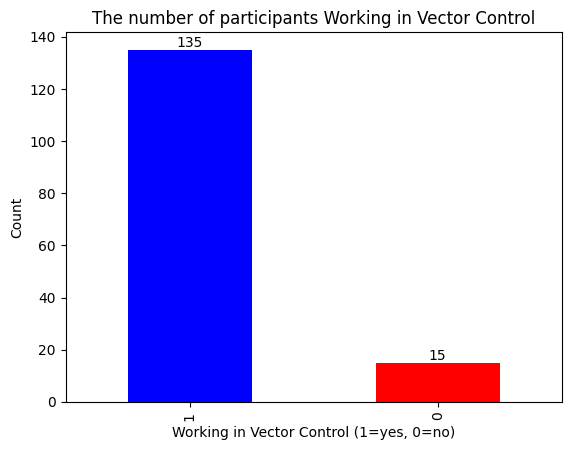

In [ ]:
# checking the number of participants that work in vector control and those that don't work in vector control
work_Vector_control = New_df['work_Vector_control']
# Count the occurrences of 1 (participants working in vector control)
counts = work_Vector_control.value_counts()
# Plotting
ax = counts.plot(kind='bar', color=['blue', 'red'])
plt.title('The number of participants Working in Vector Control')
plt.xlabel('Working in Vector Control (1=yes, 0=no)')
plt.ylabel('Count')
for i, count in enumerate(counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

In [ ]:
# Drop all the participants that don't work in vector control. That is Drop all rows where 'work_Vector_control' column equals 0
New_df = New_df[New_df['work_Vector_control'] != 0]
New_df.shape

(135, 298)

After droping the particpants that don't work in vector control, only 135 rows/participants remain.

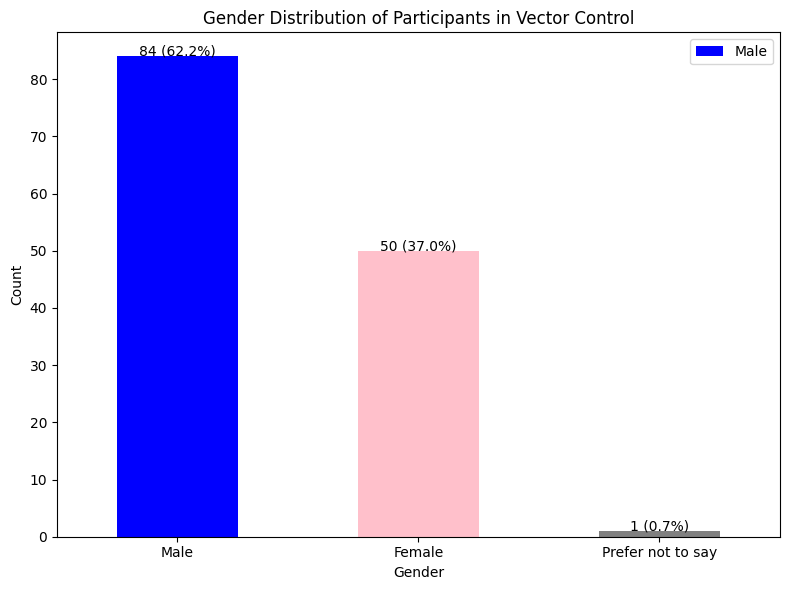

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Replace 'Prefer not to say' with 'Unknown'
vector_control_participants['Gender'] = vector_control_participants['Gender'].replace({1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'})

# Count gender distribution
gender_counts = vector_control_participants['Gender'].value_counts()
total_count = gender_counts.sum()

# Calculate percentages
gender_percentages = (gender_counts / total_count) * 100

# Plotting
plt.figure(figsize=(8, 6))
ax = gender_counts.plot(kind='bar', color=['blue', 'pink', 'gray'])

# Adding counts and percentages on top of bars
for i, count in enumerate(gender_counts):
    ax.text(i, count + 0.1, f"{count} ({gender_percentages[i]:.1f}%)", ha='center')

# Adding labels and title
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Gender Distribution of Participants in Vector Control')
plt.xticks(rotation=0)
plt.legend(labels=['Male', 'Female', 'Prefer not to say'])
plt.tight_layout()
plt.show()


The above bar chart shows that 62.2% and Male, 37.0% are Female and 0.7% for unknown (Prefer not to say)

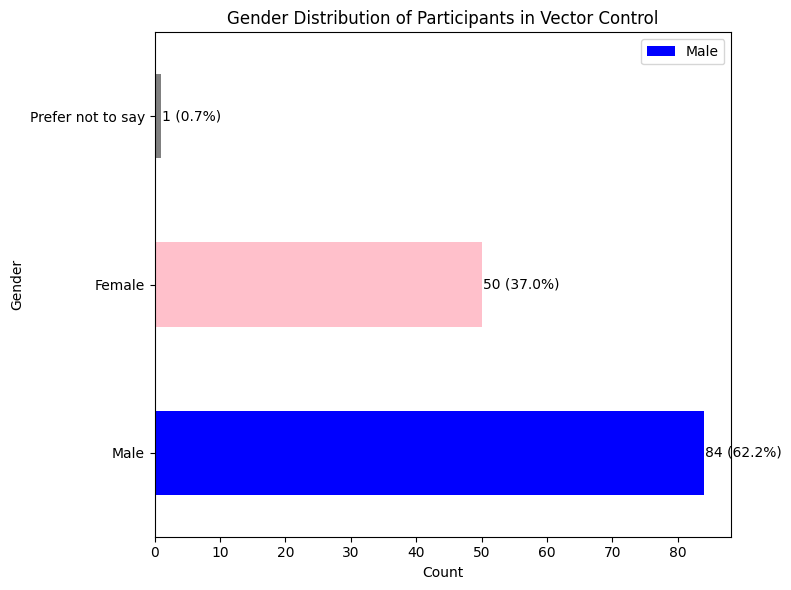

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Replace 'Prefer not to say' with 'Unknown'
vector_control_participants['Gender'] = vector_control_participants['Gender'].replace({1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'})

# Count gender distribution
gender_counts = vector_control_participants['Gender'].value_counts()
total_count = gender_counts.sum()

# Calculate percentages
gender_percentages = (gender_counts / total_count) * 100

# Plotting
plt.figure(figsize=(8, 6))
ax = gender_counts.plot(kind='barh', color=['blue', 'pink', 'gray'])

# Adding counts and percentages on the right of the bars
for i, count in enumerate(gender_counts):
    ax.text(count + 0.2, i, f"{count} ({gender_percentages[i]:.1f}%)", va='center')

# Adding labels and title
plt.xlabel('Count')
plt.ylabel('Gender')
plt.title('Gender Distribution of Participants in Vector Control')
plt.yticks(rotation=0)
plt.legend(labels=['Male', 'Female', 'Prefer not to say'])
plt.tight_layout()
plt.show()


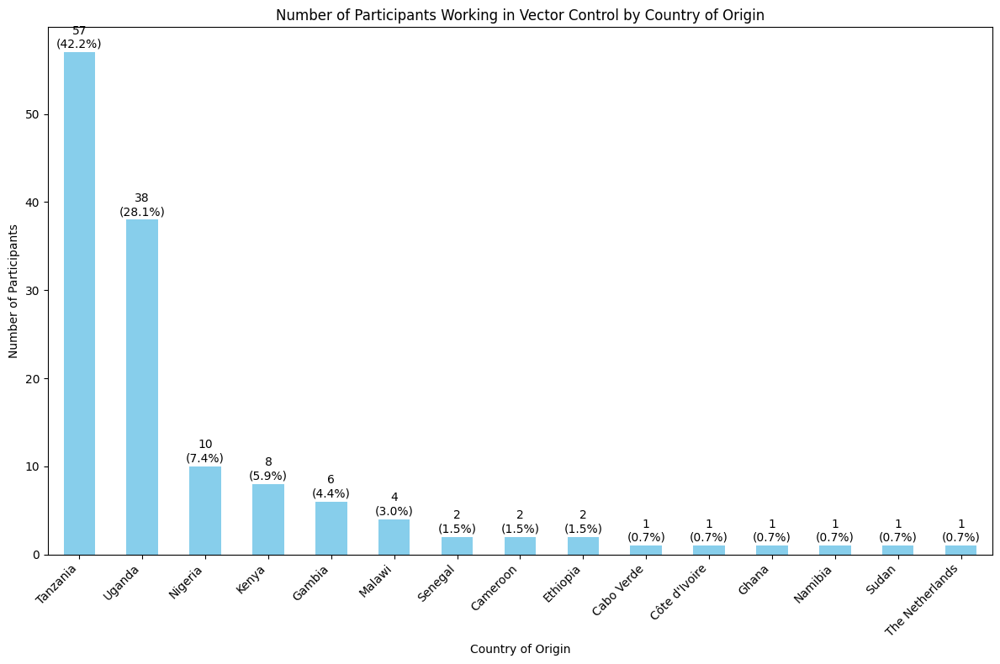

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count participants from each country
country_counts = vector_control_participants['Country of origin'].value_counts()
total_count = country_counts.sum()

# Calculate percentages
country_percentages = (country_counts / total_count) * 100

# Plotting
plt.figure(figsize=(12, 8))
ax = country_counts.plot(kind='bar', color='skyblue')

# Adding counts and percentages on top of the bars
for i, count in enumerate(country_counts):
    ax.text(i, count + 0.5, f"{count}\n({country_percentages[i]:.1f}%)", ha='center')

# Adding labels and title
plt.xlabel('Country of Origin')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Country of Origin')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


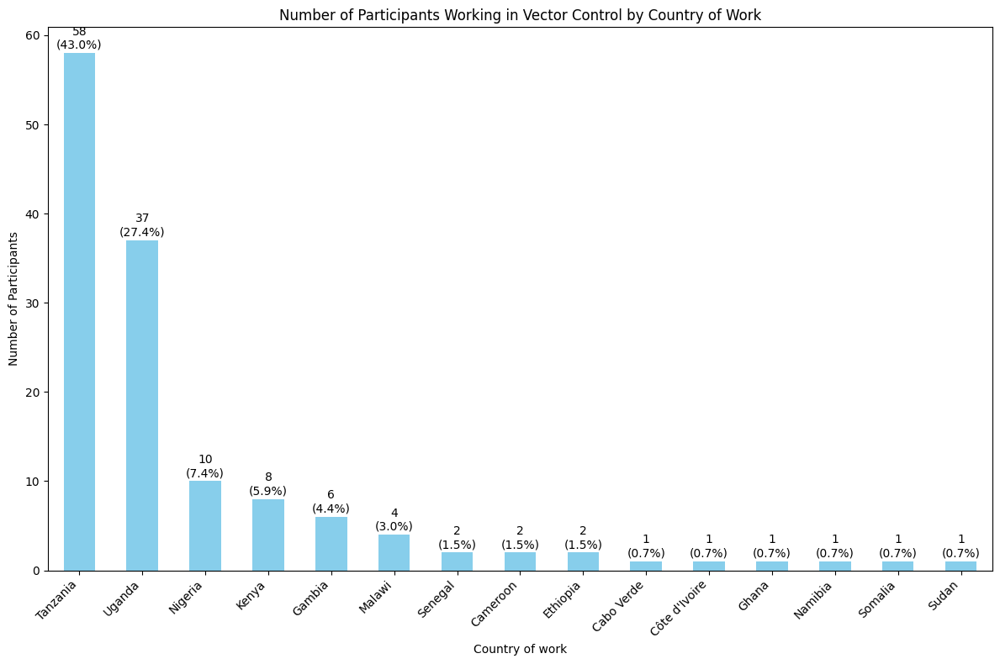

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count participants from each country
country_counts = vector_control_participants['country of work'].value_counts()
total_count = country_counts.sum()

# Calculate percentages
country_percentages = (country_counts / total_count) * 100

# Plotting
plt.figure(figsize=(12, 8))
ax = country_counts.plot(kind='bar', color='skyblue')

# Adding counts and percentages on top of the bars
for i, count in enumerate(country_counts):
    ax.text(i, count + 0.5, f"{count}\n({country_percentages[i]:.1f}%)", ha='center')

# Adding labels and title
plt.xlabel('Country of work')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Country of Work')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


The chart shows that the majority of participants/respondents that work in vector control come from Tanzania and Uganda

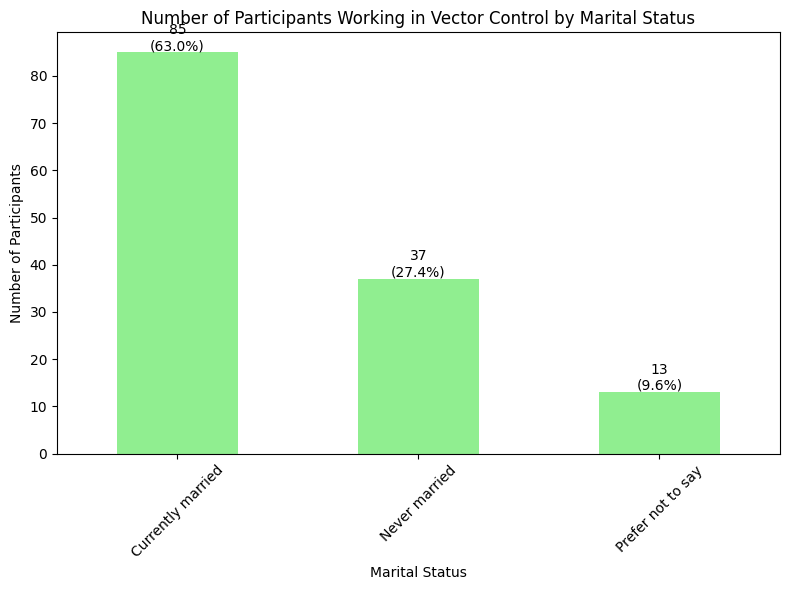

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count participants by marital status
marital_status_counts = vector_control_participants['marital_status'].value_counts()
total_participants = len(vector_control_participants)
marital_status_percentages = (marital_status_counts / total_participants) * 100

# Plotting
plt.figure(figsize=(8, 6))
ax = marital_status_counts.plot(kind='bar', color='lightgreen')

# Adding counts and percentages on top of the bars
for i, count in enumerate(marital_status_counts):
    ax.text(i, count + 0.5, f"{count}\n({marital_status_percentages.iloc[i]:.1f}%)", ha='center')

# Adding labels and title
plt.xlabel('Marital Status')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Marital Status')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The above chart shows that 63.0% who work in vector control are currently married, 27.4%, are never married and 9.6% prefer not to say.

<Figure size 1000x600 with 0 Axes>

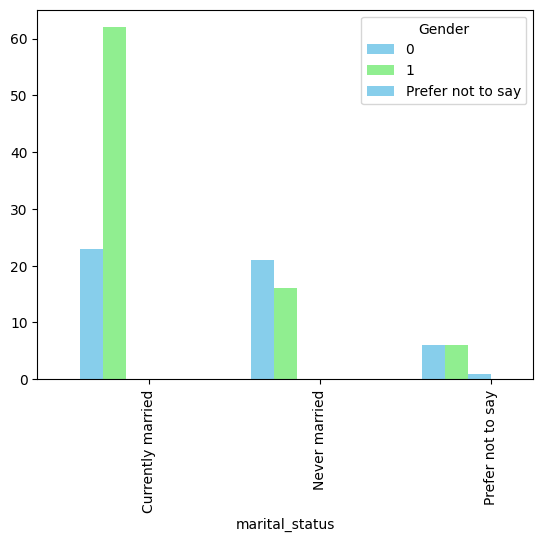

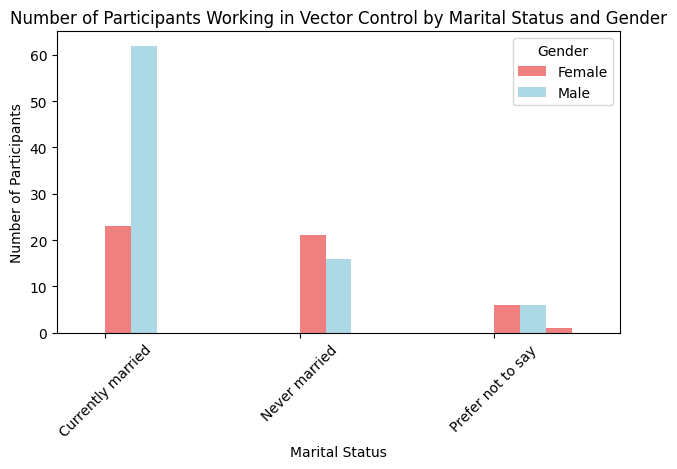

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count participants by marital status and gender
marital_gender_counts = vector_control_participants.groupby(['marital_status', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(10, 6))

# Plotting marital status
marital_status_colors = ['skyblue', 'lightgreen', 'lightcoral']
marital_gender_counts.plot(kind='bar', color=['skyblue', 'lightgreen'], width=0.4, position=1, align='center')

# Plotting gender
gender_colors = ['lightcoral', 'lightblue']
marital_gender_counts.plot(kind='bar', color=['lightcoral', 'lightblue'], width=0.4, position=0, align='center')

# Adding labels and title
plt.xlabel('Marital Status')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Marital Status and Gender')
plt.xticks(rotation=45)
plt.legend(title='Gender', loc='upper right', labels=['Female', 'Male'])
plt.tight_layout()
plt.show()


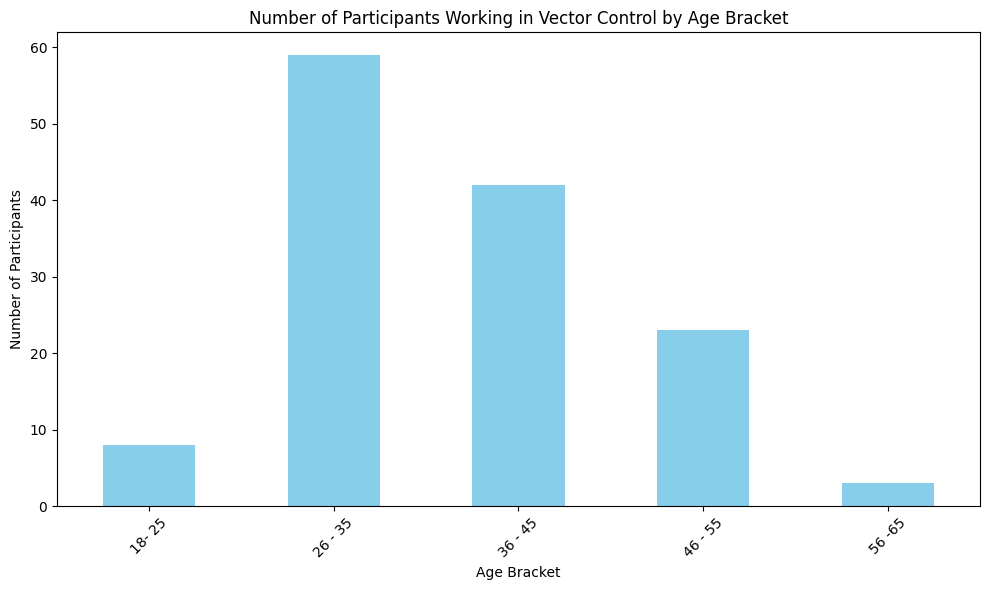

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count participants by age bracket
age_counts = vector_control_participants['age'].value_counts().sort_index()

# Plotting
plt.figure(figsize=(10, 6))
age_counts.plot(kind='bar', color='skyblue')

# Adding labels and title
plt.xlabel('Age Bracket')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Age Bracket')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


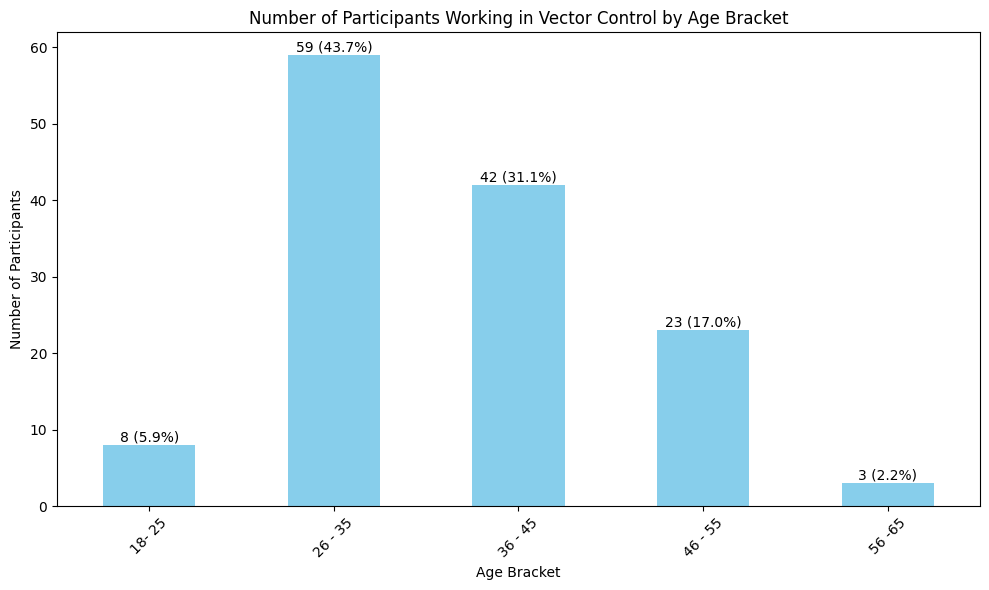

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count participants by age bracket
age_counts = vector_control_participants['age'].value_counts().sort_index()

# Calculate percentages
total_participants = age_counts.sum()
age_percentages = (age_counts / total_participants) * 100

# Plotting
plt.figure(figsize=(10, 6))
age_counts.plot(kind='bar', color='skyblue')

# Adding labels and title
plt.xlabel('Age Bracket')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Age Bracket')

# Adding percentages and counts on top of the bars
for i, count in enumerate(age_counts):
    plt.text(i, count + 0.5, f"{count} ({age_percentages.iloc[i]:.1f}%)", ha='center')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

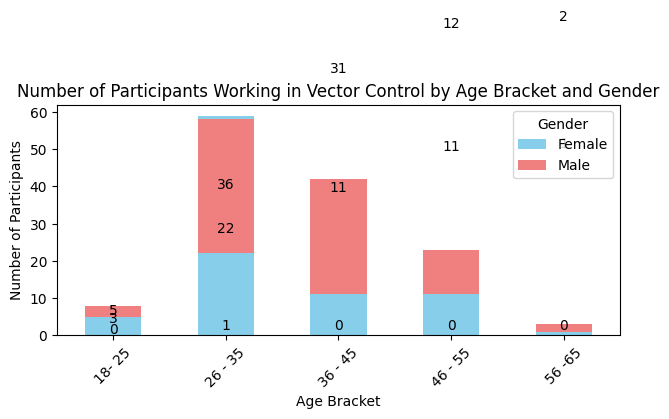

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Group by age bracket and gender, and count the number of participants
age_gender_counts = vector_control_participants.groupby(['age', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
age_gender_counts.plot(kind='bar', stacked=True, color=['skyblue', 'lightcoral'])

# Adding labels and title
plt.xlabel('Age Bracket')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Age Bracket and Gender')

# Adding legend
plt.legend(title='Gender', labels=['Female', 'Male'], loc='upper right')

# Adding counts on top of the bars
for i in range(len(age_gender_counts)):
    total = age_gender_counts.iloc[i].sum()
    for j, count in enumerate(age_gender_counts.iloc[i]):
        plt.text(i, age_gender_counts.iloc[:i, j].sum() + count + 0.5, str(count), ha='center')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<Figure size 1500x1500 with 0 Axes>

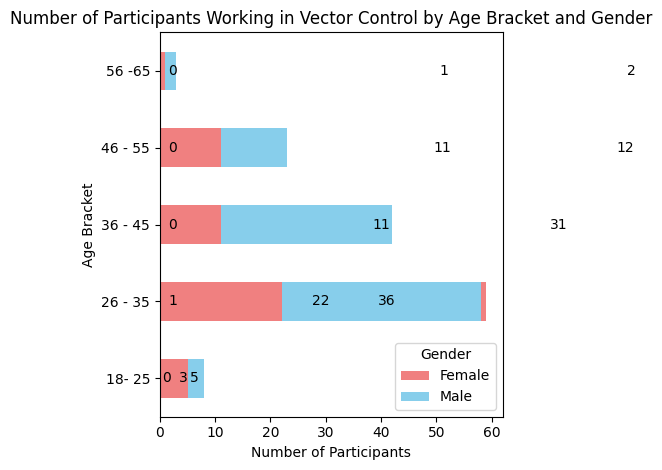

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Group by age bracket and gender, and count the number of participants
age_gender_counts = vector_control_participants.groupby(['age', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(15, 15))
age_gender_counts.plot(kind='barh', stacked=True, color=['lightcoral', 'skyblue'])

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Age Bracket')
plt.title('Number of Participants Working in Vector Control by Age Bracket and Gender')

# Adding legend
plt.legend(title='Gender', labels=['Female', 'Male'], loc='lower right')

# Adding counts on top of the bars
for i in range(len(age_gender_counts)):
    total = age_gender_counts.iloc[i].sum()
    for j, count in enumerate(age_gender_counts.iloc[i]):
        plt.text(age_gender_counts.iloc[:i, j].sum() + count + 0.5, i, str(count), va='center')

plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

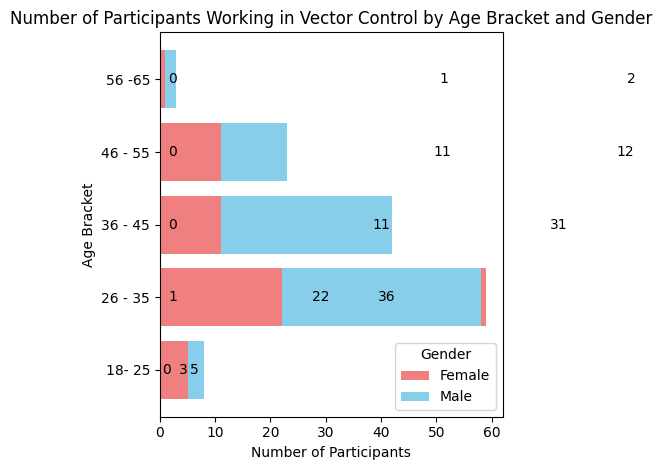

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Group by age bracket and gender, and count the number of participants
age_gender_counts = vector_control_participants.groupby(['age', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))  # Increase figure size
age_gender_counts.plot(kind='barh', stacked=True, color=['lightcoral', 'skyblue'], width=0.8)  # Adjust bar width

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Age Bracket')
plt.title('Number of Participants Working in Vector Control by Age Bracket and Gender')

# Adding legend
plt.legend(title='Gender', labels=['Female', 'Male'], loc='lower right')

# Adding counts on top of the bars
for i in range(len(age_gender_counts)):
    total = age_gender_counts.iloc[i].sum()
    for j, count in enumerate(age_gender_counts.iloc[i]):
        plt.text(age_gender_counts.iloc[:i, j].sum() + count + 0.5, i, str(count), va='center')

plt.tight_layout()
plt.show()


<Figure size 1200x2000 with 0 Axes>

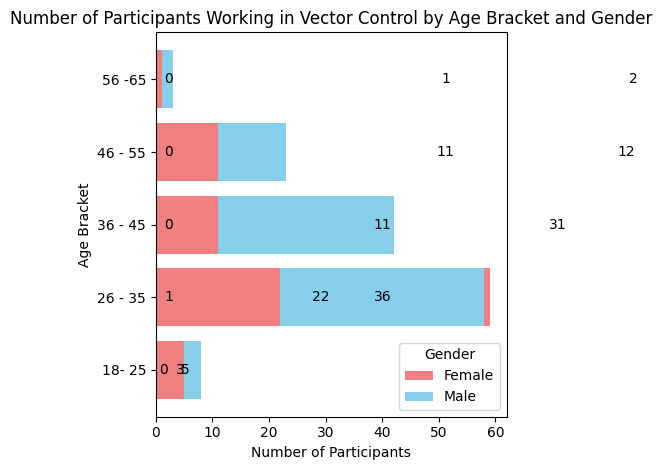

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Group by age bracket and gender, and count the number of participants
age_gender_counts = vector_control_participants.groupby(['age', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 20))  # Increase figure size
age_gender_counts.plot(kind='barh', stacked=True, color=['lightcoral', 'skyblue'], width=0.8)  # Adjust bar width

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Age Bracket')
plt.title('Number of Participants Working in Vector Control by Age Bracket and Gender')

# Adding legend
plt.legend(title='Gender', labels=['Female', 'Male'], loc='lower right')

# Adding counts on top of the bars
for i in range(len(age_gender_counts)):
    total = age_gender_counts.iloc[i].sum()
    for j, count in enumerate(age_gender_counts.iloc[i]):
        if count > total / 2:
            plt.text(age_gender_counts.iloc[:i, j].sum() + count - 0.5, i, str(count), va='center')
        else:
            plt.text(age_gender_counts.iloc[:i, j].sum() + count + 0.5, i, str(count), va='center')

plt.tight_layout()
plt.show()


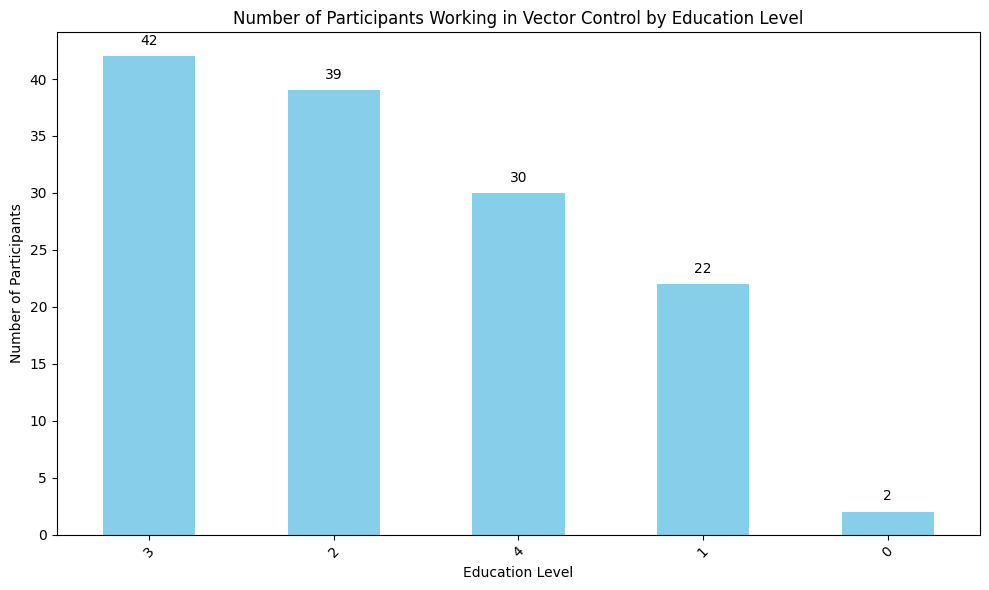

In [ ]:
# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Count the number of participants by education level
education_counts = vector_control_participants['Education'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
education_counts.plot(kind='bar', color='skyblue')

# Adding labels and title
plt.xlabel('Education Level')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Education Level')

# Adding counts on top of the bars
for i, count in enumerate(education_counts):
    plt.text(i, count + 1, str(count), ha='center')

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


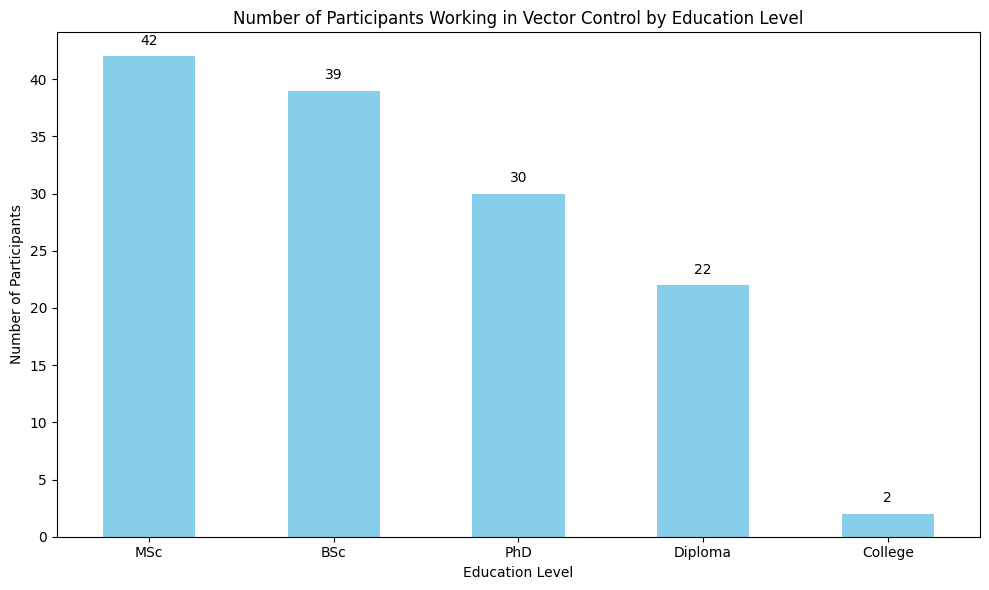

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Mapping education levels to their corresponding labels
education_mapping = {
    0: 'College',
    1: 'Diploma',
    2: 'BSc',
    3: 'MSc',
    4: 'PhD'
}

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Replace education levels with their corresponding labels
vector_control_participants['Education'] = vector_control_participants['Education'].map(education_mapping)

# Count the number of participants by education level
education_counts = vector_control_participants['Education'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
education_counts.plot(kind='bar', color='skyblue')

# Adding labels and title
plt.xlabel('Education Level')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Education Level')

# Adding counts on top of the bars
for i, count in enumerate(education_counts):
    plt.text(i, count + 1, str(count), ha='center')

plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

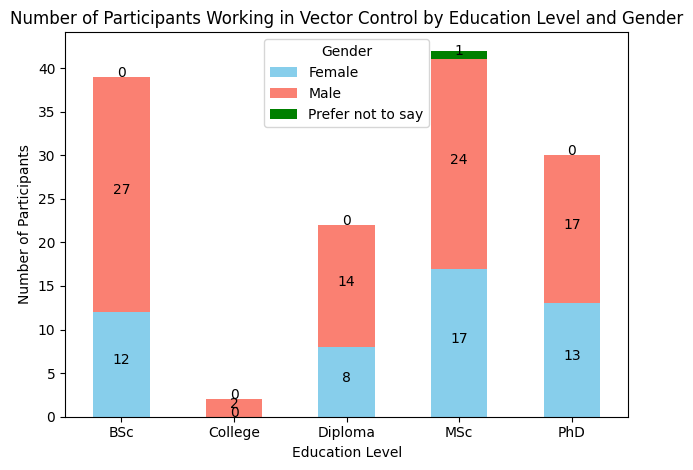

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Mapping education levels to their corresponding labels
education_mapping = {
    0: 'College',
    1: 'Diploma',
    2: 'BSc',
    3: 'MSc',
    4: 'PhD'
}

# Mapping gender codes to their corresponding labels
gender_mapping = {
    0: 'Female',
    1: 'Male',
    'Prefer not to say': 'Prefer not to say'
}

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Replace education levels and gender codes with their corresponding labels
vector_control_participants['Education'] = vector_control_participants['Education'].map(education_mapping)
vector_control_participants['Gender'] = vector_control_participants['Gender'].map(gender_mapping)

# Count the number of participants by education level and gender
education_gender_counts = vector_control_participants.groupby(['Education', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(10, 6))
education_gender_counts.plot(kind='bar', stacked=True, color=['skyblue', 'salmon','green'])

# Adding labels and title
plt.xlabel('Education Level')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Education Level and Gender')

# Adding counts on top of the bars
for i, level in enumerate(education_gender_counts.index):
    for j, count in enumerate(education_gender_counts.columns):
        plt.text(i, education_gender_counts.iloc[i, :j].sum() + education_gender_counts.iloc[i, j] / 2, str(education_gender_counts.iloc[i, j]), ha='center')

plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

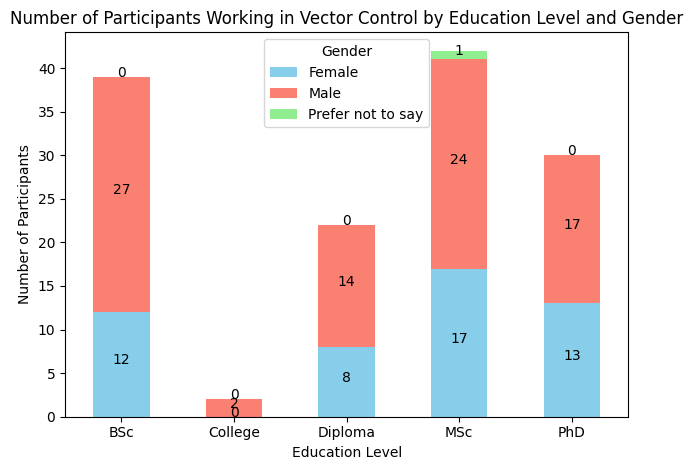

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Mapping education levels to their corresponding labels
education_mapping = {
    0: 'College',
    1: 'Diploma',
    2: 'BSc',
    3: 'MSc',
    4: 'PhD'
}

# Mapping gender codes to their corresponding labels
gender_mapping = {
    0: 'Female',
    1: 'Male',
    'Prefer not to say': 'Prefer not to say'
}

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Replace education levels and gender codes with their corresponding labels
vector_control_participants['Education'] = vector_control_participants['Education'].map(education_mapping)
vector_control_participants['Gender'] = vector_control_participants['Gender'].map(gender_mapping)

# Count the number of participants by education level and gender
education_gender_counts = vector_control_participants.groupby(['Education', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(10, 6))
education_gender_counts.plot(kind='bar', stacked=True, color=['skyblue', 'salmon', 'lightgreen'])

# Adding labels and title
plt.xlabel('Education Level')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Education Level and Gender')

# Adding counts on top of the bars
for i, level in enumerate(education_gender_counts.index):
    for j, count in enumerate(education_gender_counts.columns):
        plt.text(i, education_gender_counts.iloc[i, :j].sum() + education_gender_counts.iloc[i, j] / 2, str(education_gender_counts.iloc[i, j]), ha='center')

plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

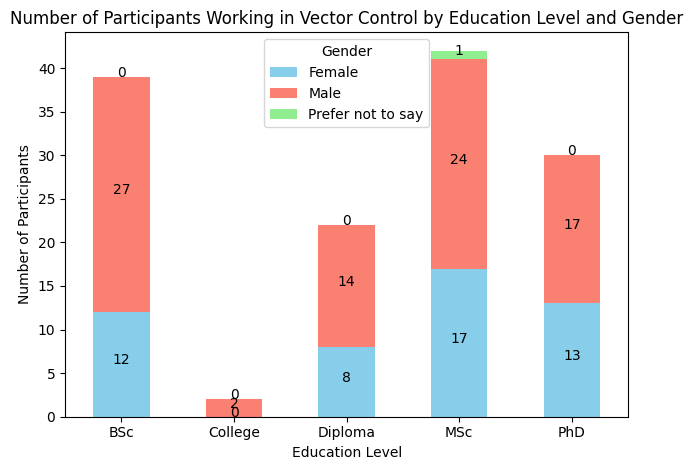

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Mapping education levels to their corresponding labels
education_mapping = {
    0: 'College',
    1: 'Diploma',
    2: 'BSc',
    3: 'MSc',
    4: 'PhD'
}

# Mapping gender codes to their corresponding labels
gender_mapping = {
    0: 'Female',
    1: 'Male',
    'Prefer not to say': 'Prefer not to say'
}

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Replace education levels and gender codes with their corresponding labels
vector_control_participants['Education'] = vector_control_participants['Education'].map(education_mapping)
vector_control_participants['Gender'] = vector_control_participants['Gender'].map(gender_mapping)

# Count the number of participants by education level and gender
education_gender_counts = vector_control_participants.groupby(['Education', 'Gender']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(10, 6))
education_gender_counts.plot(kind='bar', stacked=True, color=['skyblue', 'salmon', 'lightgreen'])

# Adding labels and title
plt.xlabel('Education Level')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Education Level and Gender')

# Adding counts on top of the bars
for i, level in enumerate(education_gender_counts.index):
    for j, count in enumerate(education_gender_counts.columns):
        plt.text(i, education_gender_counts.iloc[i, :j].sum() + education_gender_counts.iloc[i, j] / 2, str(education_gender_counts.iloc[i, j]), ha='center')

plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

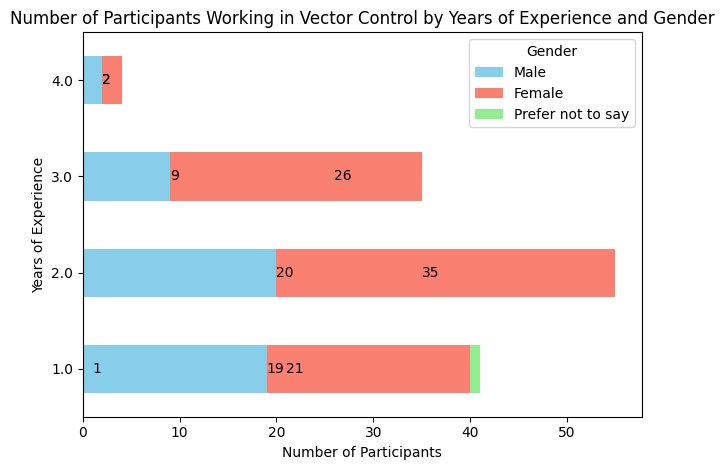

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Map gender responses to labels
gender_labels = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
vector_control_participants['Gender'] = vector_control_participants['Gender'].map(gender_labels)

# Count the number of participants by years of experience and gender
experience_gender_counts = vector_control_participants.groupby(['Eyrs', 'Gender']).size().unstack(fill_value=0)

# Add the 'Prefer not to say' category if not present
if 'Prefer not to say' not in experience_gender_counts.columns:
    experience_gender_counts['Prefer not to say'] = 0

# Plotting
plt.figure(figsize=(10, 6))
experience_gender_counts.plot(kind='barh', stacked=True, color=['skyblue', 'salmon', 'lightgreen'])

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Years of Experience')
plt.title('Number of Participants Working in Vector Control by Years of Experience and Gender')

# Adding counts on top of the bars
for i, (index, row) in enumerate(experience_gender_counts.iterrows()):
    for j, value in enumerate(row):
        if value > 0:  # Only add count if value is greater than 0
            plt.text(value, i, str(value), ha='left', va='center')

# Legend with all gender responses
plt.legend(title='Gender', labels=['Male', 'Female', 'Prefer not to say'])

plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

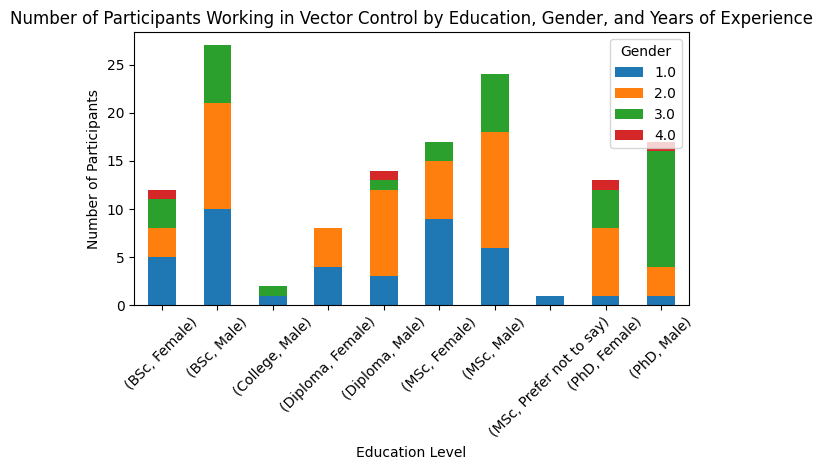

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Map gender responses to labels
gender_labels = {1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}
vector_control_participants['Gender'] = vector_control_participants['Gender'].map(gender_labels)

# Map education levels
education_labels = {4: 'PhD', 3: 'MSc', 2: 'BSc', 1: 'Diploma', 0: 'College'}
vector_control_participants['Education'] = vector_control_participants['Education'].map(education_labels)

# Count the number of participants by education, gender, and years of experience
education_gender_experience_counts = vector_control_participants.groupby(['Education', 'Gender', 'Eyrs']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
education_gender_experience_counts.plot(kind='bar', stacked=True)

# Adding labels and title
plt.xlabel('Education Level')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Education, Gender, and Years of Experience')

# Adding legend
plt.legend(title='Gender')

# Show plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


This a stacked bar chart shows the number of participants in vector control categorized by their education level, gender, and years of experience.

<Figure size 1200x800 with 0 Axes>

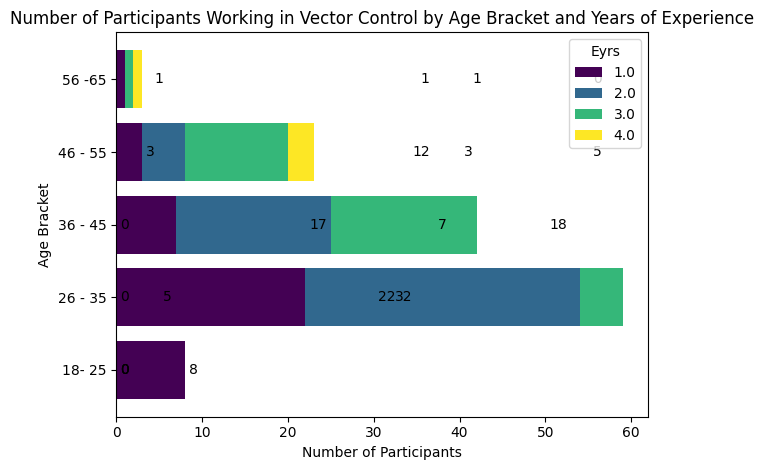

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Group by age bracket and years of experience, and count the number of participants
age_experience_counts = vector_control_participants.groupby(['age', 'Eyrs']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))  # Increase figure size
age_experience_counts.plot(kind='barh', stacked=True, colormap='viridis', width=0.8)  # Adjust bar width

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Age Bracket')
plt.title('Number of Participants Working in Vector Control by Age Bracket and Years of Experience')

# Adding counts on top of the bars
for i in range(len(age_experience_counts)):
    total = age_experience_counts.iloc[i].sum()
    for j, count in enumerate(age_experience_counts.iloc[i]):
        plt.text(age_experience_counts.iloc[:i, j].sum() + count + 0.5, i, str(count), va='center')

plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

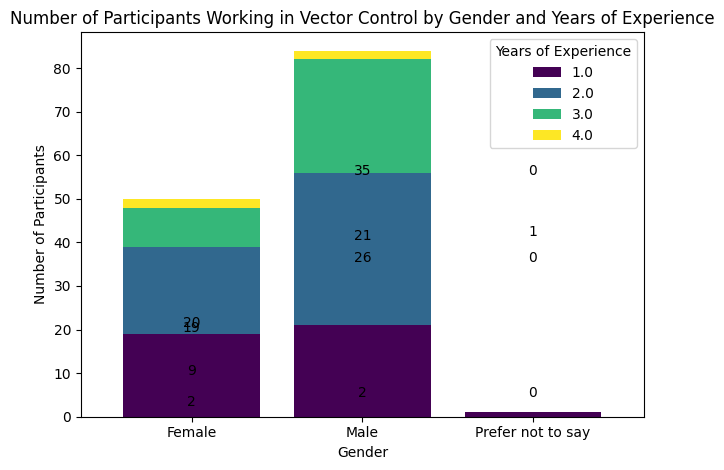

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Drop all blank responses from the 'Eyrs' column
vector_control_participants = vector_control_participants.dropna(subset=['Eyrs'])

# Replace gender codes with labels
vector_control_participants['Gender'].replace({1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}, inplace=True)

# Group by gender and years of experience, and count the number of participants
gender_experience_counts = vector_control_participants.groupby(['Gender', 'Eyrs']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
gender_experience_counts.plot(kind='bar', stacked=True, colormap='viridis', width=0.8)

# Adding labels and title
plt.xlabel('Gender')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Gender and Years of Experience')

# Adding legend
plt.legend(title='Years of Experience')

# Adding counts on top of the bars
for i in range(len(gender_experience_counts)):
    total = gender_experience_counts.iloc[i].sum()
    for j, count in enumerate(gender_experience_counts.iloc[i]):
        plt.text(i, gender_experience_counts.iloc[:i, j].sum() + count + 0.5, str(count), ha='center')

plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

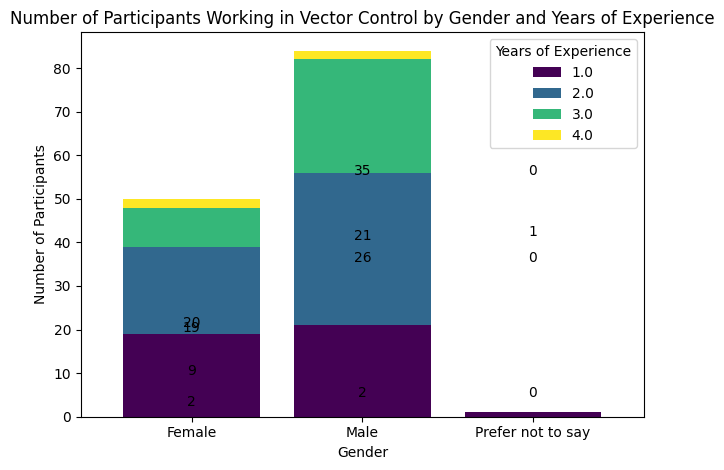

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Drop all blank responses from the 'Eyrs' column
vector_control_participants = vector_control_participants.dropna(subset=['Eyrs'])

# Replace gender codes with labels
vector_control_participants['Gender'].replace({1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}, inplace=True)

# Group by gender and years of experience, and count the number of participants
gender_experience_counts = vector_control_participants.groupby(['Gender', 'Eyrs']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
gender_experience_counts.plot(kind='bar', stacked=True, colormap='viridis', width=0.8)

# Adding labels and title
plt.xlabel('Gender')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Gender and Years of Experience')

# Adding legend
plt.legend(title='Years of Experience')

# Adding counts on top of the bars
for i in range(len(gender_experience_counts)):
    total = gender_experience_counts.iloc[i].sum()
    for j, count in enumerate(gender_experience_counts.iloc[i]):
        plt.text(i, gender_experience_counts.iloc[:i, j].sum() + count + 0.5, str(count), ha='center')

plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

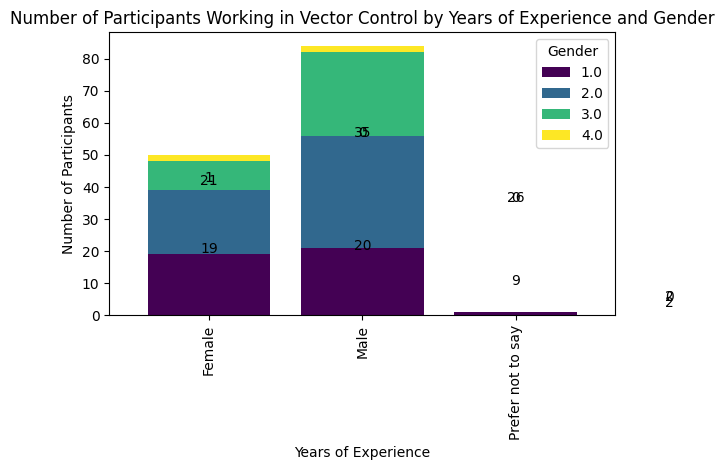

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Drop all blank responses from the 'Eyrs' column
vector_control_participants = vector_control_participants.dropna(subset=['Eyrs'])

# Replace gender codes with labels
vector_control_participants['Gender'].replace({1: 'Male', 0: 'Female', 'Prefer not to say': 'Prefer not to say'}, inplace=True)

# Group by gender and years of experience, and count the number of participants
gender_experience_counts = vector_control_participants.groupby(['Gender', 'Eyrs']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
gender_experience_counts.plot(kind='bar', stacked=True, colormap='viridis', width=0.8)

# Adding labels and title
plt.xlabel('Years of Experience')
plt.ylabel('Number of Participants')
plt.title('Number of Participants Working in Vector Control by Years of Experience and Gender')

# Adding legend
plt.legend(title='Gender')

# Adding counts on top of the bars
for i in range(len(gender_experience_counts)):
    total = gender_experience_counts.iloc[i].sum()
    for j, count in enumerate(gender_experience_counts.iloc[i]):
        plt.text(j, gender_experience_counts.iloc[:i, j].sum() + count + 0.5, str(count), ha='center')

plt.tight_layout()
plt.show()


<ipython-input-102-eba2e47b9ee5>:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 1200x800 with 0 Axes>

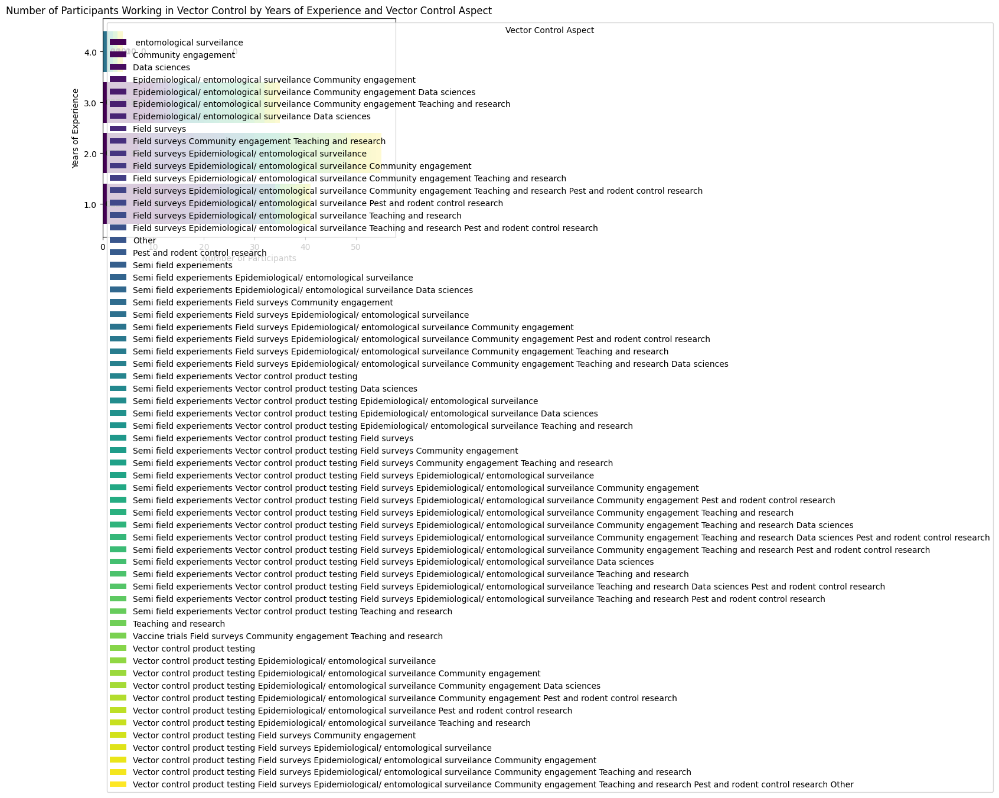

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Drop all blank responses from the 'Eyrs' column
vector_control_participants = vector_control_participants.dropna(subset=['Eyrs'])

# Group by years of experience and vector control aspect, and count the number of participants
experience_vc_aspect_counts = vector_control_participants.groupby(['Eyrs', 'VC aspect']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
experience_vc_aspect_counts.plot(kind='barh', stacked=True, colormap='viridis', width=0.8)

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Years of Experience')
plt.title('Number of Participants Working in Vector Control by Years of Experience and Vector Control Aspect')

# Adding legend
plt.legend(title='Vector Control Aspect')

# Adding counts on top of the bars
for i in range(len(experience_vc_aspect_counts)):
    total = experience_vc_aspect_counts.iloc[i].sum()
    for j, count in enumerate(experience_vc_aspect_counts.iloc[i]):
        plt.text(experience_vc_aspect_counts.iloc[:i, j].sum() + count + 0.5, i, str(count), va='center')

plt.tight_layout()
plt.show()


<Figure size 1200x800 with 0 Axes>

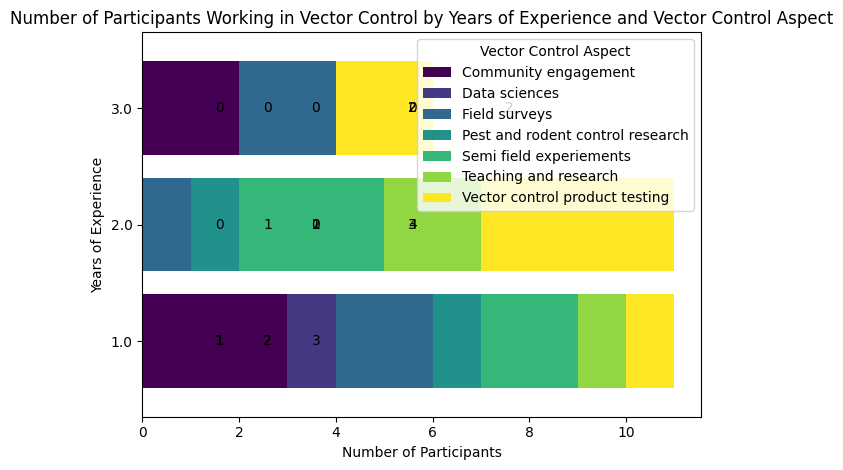

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter participants working in vector control
vector_control_participants = New_df[New_df['work_Vector_control'] == 1]

# Drop all blank responses from the 'Eyrs' column
vector_control_participants = vector_control_participants.dropna(subset=['Eyrs'])

# List of vector control aspects to include
vector_control_aspects = [
    'Semi field experiements',
    'Vaccine trials',
    'Vector control product testing',
    'Field surveys',
    'entomological surveilance',
    'Community engagement',
    'Teaching and research',
    'Data sciences',
    'Pest and rodent control research'
]

# Filter vector control participants by specified aspects
vector_control_participants = vector_control_participants[vector_control_participants['VC aspect'].isin(vector_control_aspects)]

# Group by years of experience and vector control aspect, and count the number of participants
experience_vc_aspect_counts = vector_control_participants.groupby(['Eyrs', 'VC aspect']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
experience_vc_aspect_counts.plot(kind='barh', stacked=True, colormap='viridis', width=0.8)

# Adding labels and title
plt.xlabel('Number of Participants')
plt.ylabel('Years of Experience')
plt.title('Number of Participants Working in Vector Control by Years of Experience and Vector Control Aspect')

# Adding legend
plt.legend(title='Vector Control Aspect')

# Adding counts on top of the bars
for i in range(len(experience_vc_aspect_counts)):
    total = experience_vc_aspect_counts.iloc[i].sum()
    for j, count in enumerate(experience_vc_aspect_counts.iloc[i]):
        plt.text(experience_vc_aspect_counts.iloc[:i, j].sum() + count + 0.5, i, str(count), va='center')

plt.tight_layout()
plt.show()
